# CURSO DATA SCIENCE DIGITAL HOUSE

# WORKSHOP I: Limpieza de Datos (Caso Properatti)

## Grupo 3 - Integrantes

- D'HUTEAU, Yann F
- MESA, Andrés
- HERNANDEZ, Adrián
- CORBATTO, Mauricio D

## Intro


Para este trabajo se pretende implementar un estudio para la empresa inmobiliaria Properati con el fin de predecir el precio por metro cuadrado de una propiedad desarrollando modelos de regresión con la ayuda de herramientas analíticas.

Para este primer paso, se pretende revisar la información (dataset) suministrado por Properati y "limpiar" la data. Para esto repasaremos por los siguientes pasos:

<a id="section_toc"></a> 
## Tabla de Contenido


[1. Importar librerías](#section_importar_libreria)

[2. Dataset](#section_dataset)

[3. Detección de valores faltantes](#section_deteccion_faltantes)

[4. Eliminación de Duplicados](#section_eliminar_duplicados)

[5. Análisis de Datos](#section_analisis_datos)

[6. Imputación de Datos](#section_imputacion_datos)

[7. Otros Análisis](#section_otros_analisis)

[8. Detección de Outliers](#section_outliers)

[9. Extras](#section_extras)

[10. Exportación de Dataframe Limpio](#section_exportacion)


<a id="section_importar_libreria"></a> 
### 1. Importar Librerías

   Importaremos las librerías necesarias que nos ayudarán con la conexión, extracción, análisis y modificación del dataset.

In [1]:
import pandas as pd
import seaborn as sns
import re
import matplotlib.pyplot as plt
import numpy as np
import warnings
import scipy.stats as ss
from scipy.stats import levene
import geomet
from geomet import wkt
import plotly.express as px
warnings.filterwarnings("ignore")
pd.options.display.max_columns = 30

<a id="section_dataset"></a> 
### 2. Dataset


El dataset que usaremos en esta practica contiene la información de multiples propiedades en venta con información suministrada la empresa Properati, donde encontraremos información relevante la cuál nos ayudará a suministrar información para el estudio de precio por metro cuadrado, tal como por ejemplo:

**Price**: precio del inmueble

**Currency**: divisa por la cual se establece el precio previo.

**price_aprox_local_currency**: Precio aproximado del inmueble en la moneda local (Peso Argentino)

**price_aprox_usd**: Precio aproximado del inmueble en dólares (USD)

**surface_total_in_m2**: superficie total del inmueble en metros cuadrados

**surface_covered_in_m2**: superficie cubierta del inmueble en metros cuadrados

**price_usd_per_m2**: Precio por metro cuadrado en dólares (USD)

**price_per_m2**: Precio por metro cuadrado en la moneda local (Peso Argentino).

Entre otras variables descriptivas de los inmuebles los cuales nos ayudarán en caso de encontrar valores faltantes que nos impidan deducir el valor del metro cuadrado de cada uno.

-------------------------------------
Leemos los datos desde el archivo csv

In [2]:
data = pd.read_csv('properatti.csv', low_memory=False)

---------------------------------------
Exploramos rápidamente las columnas que se encuentran en el dataset

In [3]:
print(data.columns)
data.shape

Index(['Unnamed: 0', 'operation', 'property_type', 'place_name',
       'place_with_parent_names', 'country_name', 'state_name', 'geonames_id',
       'lat-lon', 'lat', 'lon', 'price', 'currency',
       'price_aprox_local_currency', 'price_aprox_usd', 'surface_total_in_m2',
       'surface_covered_in_m2', 'price_usd_per_m2', 'price_per_m2', 'floor',
       'rooms', 'expenses', 'properati_url', 'description', 'title',
       'image_thumbnail'],
      dtype='object')


(121220, 26)

-----------------------------
Se procede a hacer una vista previa del Dataset

In [4]:
data.head()

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
0,0,sell,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,-58.508839,62000.0,USD,1093959.0,62000.0,55.0,40.0,1127.272727,1550.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bo8_venta_ph_mat...,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB,https://thumbs4.properati.com/8/BluUYiHJLhgIIK...
1,1,sell,apartment,La Plata,|Argentina|Bs.As. G.B.A. Zona Sur|La Plata|,Argentina,Bs.As. G.B.A. Zona Sur,3432039.0,"-34.9038831,-57.9643295",-34.903883,-57.964330,150000.0,USD,2646675.0,150000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15bob_venta_depart...,Venta de departamento en décimo piso al frente...,VENTA Depto 2 dorm. a estrenar 7 e/ 36 y 37 ...,https://thumbs4.properati.com/7/ikpVBu2ztHA7jv...
2,2,sell,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,-58.522982,72000.0,USD,1270404.0,72000.0,55.0,55.0,1309.090909,1309.090909,NaN,NaN,NaN,http://www.properati.com.ar/15bod_venta_depart...,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO,https://thumbs4.properati.com/5/SXKr34F_IwG3W_...
3,3,sell,PH,Liniers,|Argentina|Capital Federal|Liniers|,Argentina,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,-58.516424,95000.0,USD,1676227.5,95000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15boh_venta_ph_lin...,PH 3 ambientes con patio. Hay 3 deptos en lote...,PH 3 amb. cfte. reciclado,https://thumbs4.properati.com/3/DgIfX-85Mog5SP...
4,4,sell,apartment,Centro,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,3435548.0,"-38.0026256,-57.5494468",-38.002626,-57.549447,64000.0,USD,1129248.0,64000.0,35.0,35.0,1828.571429,1828.571429,NaN,NaN,NaN,http://www.properati.com.ar/15bok_venta_depart...,DEPARTAMENTO CON FANTÁSTICA ILUMINACIÓN NATURA...,DEPTO 2 AMB AL CONTRAFRENTE ZONA CENTRO/PLAZA ...,https://thumbs4.properati.com/5/xrRqlNcSI_vs-f...


<a id="section_deteccion_faltantes"></a> 
### 3. Detección de valores faltantes


Comenzaremos detectando qué registros tienen valores nulos para luego calcular el porcentaje de valores faltantes en cada columna.

Para esto se define una función que contará la cantidad de nulos, y total de registros para calcular dicha métrica.


In [5]:
def obtener_info_data(data):
    total_rows = data.shape[0]
    df_info = pd.DataFrame(columns=['Nulos','NoNulos', 'NulosPorc', 'NoNulosPorc', 'TypeData'])
    for col in data.columns:
        nulos = data[col].isnull().sum()
        no_nulos = data[col].notnull().sum()
        nulos_perc = round(100 * nulos/total_rows,1)
        no_nulos_perc = round(100 * no_nulos/total_rows,1)
        type_data = data[col].dtypes
        df_info.loc[col] = [nulos, no_nulos, nulos_perc, no_nulos_perc, type_data]
        
    return df_info

-------------------------------------
Antes de ejecutar la función de detección de valores faltantes se observan columnas como **Unnamed:0** las cuales a simple vista no generan valor y se podrían eliminar para el estudio, es por esto mismo que se genera una función para eliminar este tipo de columnas.

In [6]:
# Definimos una función para eliminar columnas
columnas_eliminadas = []
def  borrar_columna(data, columna):
    try:
        data.drop(columna, axis=1, inplace=True)
        columnas_eliminadas.append(columna)
        print(f'Eliminando columna: {columna}')
        print(f'Lista de columnas eliminadas: {columnas_eliminadas}')
        print('-' * 100)
    except:
        print(f'La columna {columna} ya ha sido eliminada')
        print(f'Lista de columnas eliminadas: {columnas_eliminadas}') 
        print('-' * 100)

--------------------------
Se ejecuta entonces la función de Detección de Valores faltantes para analizar el poblamiento de datos del Dataset

In [7]:
obtener_info_data(data)

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
Unnamed: 0,0,121220,0.0,100.0,int64
operation,0,121220,0.0,100.0,object
property_type,0,121220,0.0,100.0,object
place_name,23,121197,0.0,100.0,object
place_with_parent_names,0,121220,0.0,100.0,object
country_name,0,121220,0.0,100.0,object
state_name,0,121220,0.0,100.0,object
geonames_id,18717,102503,15.4,84.6,float64
lat-lon,51550,69670,42.5,57.5,object
lat,51550,69670,42.5,57.5,float64


 De realizar esta inspección se pueden evidenciar algunos puntos que resultan interesantes:
 - La variable "floor" posee un elevado porcentaje de valores nulos, imputar los valores faltantes carecería de sentido. La misma sería una columna candidata a eliminar.
 - La variable "expenses" se encuentra en una estado similar, pero al tratarse de un valor monetario la dejaremos también por el momento.
 - Existen variables con porcentajes de nulos bajos-medios, las cuales seguramente demandarán una imputación.

In [8]:
data_graf_1 = obtener_info_data(data)
data_graf_1_mask_mayor10 = data_graf_1.NulosPorc > 10
data_graf_1_mayor10 = data_graf_1.loc[data_graf_1_mask_mayor10]
data_graf_1_mayor10

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
geonames_id,18717,102503,15.4,84.6,float64
lat-lon,51550,69670,42.5,57.5,object
lat,51550,69670,42.5,57.5,float64
lon,51550,69670,42.5,57.5,float64
price,20410,100810,16.8,83.2,float64
currency,20411,100809,16.8,83.2,object
price_aprox_local_currency,20410,100810,16.8,83.2,float64
price_aprox_usd,20410,100810,16.8,83.2,float64
surface_total_in_m2,39328,81892,32.4,67.6,float64
surface_covered_in_m2,19907,101313,16.4,83.6,float64


In [9]:
data_graf_1_mayor10_sorted = data_graf_1_mayor10.NulosPorc.sort_values()
data_graf_1_mayor10_sorted

geonames_id                   15.4
surface_covered_in_m2         16.4
price                         16.8
currency                      16.8
price_aprox_local_currency    16.8
price_aprox_usd               16.8
price_per_m2                  27.7
surface_total_in_m2           32.4
lat-lon                       42.5
lat                           42.5
lon                           42.5
price_usd_per_m2              43.4
rooms                         60.9
expenses                      88.2
floor                         93.5
Name: NulosPorc, dtype: float64

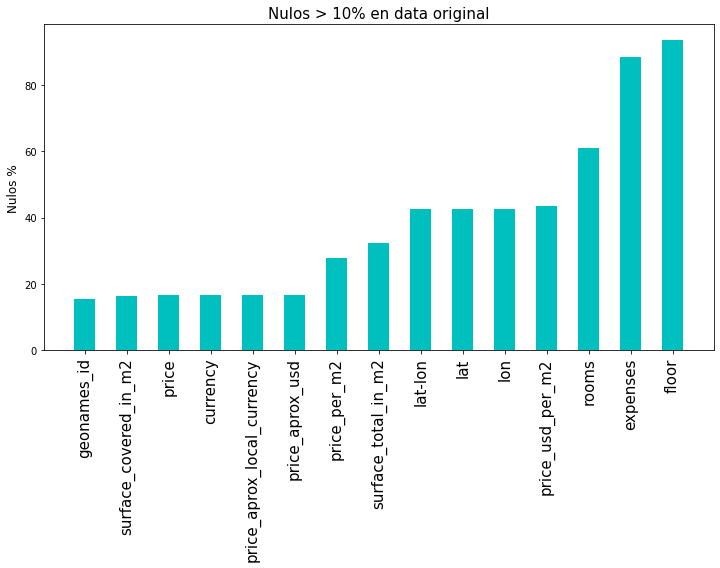

In [10]:
ind = (data_graf_1_mayor10_sorted.index)
width = 0.5

fig = plt.figure(figsize=(12,6)); ax=plt.axes()

ax.bar(ind, data_graf_1_mayor10_sorted, width, color="c")

ax.set_ylabel("Nulos %", size=12)
ax.set_title("Nulos > 10% en data original", size=15)
ax.set_xticks(ind)
plt.setp(ax.xaxis.get_majorticklabels(), rotation=90)
ax.set_xticklabels(ind, fontsize=15)

plt.show()

<Figure size 1080x432 with 0 Axes>

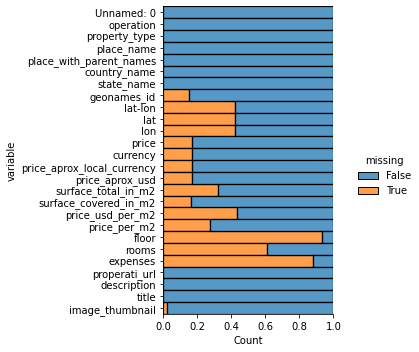

In [11]:
# OTRA MANERA DE GRAFICAR LAS VARIABLES NULAS
plt.figure(figsize=(15,6))
sns.displot(data=data.isna().melt(value_name="missing"), y="variable", multiple="fill", hue="missing", aspect=1)

<a id="section_eliminar_duplicados"></a> 
### 4. Eliminación de Duplicados



Antes de la eliminación de elementos duplicados, observaremos el tamaño de la tabla con la función **Shape**.


In [12]:
print("Shape antes de eliminar duplicados")
display(data.shape)
columnas_duplic = ['Unnamed: 0', 'properati_url', 'image_thumbnail']
duplicados_col = [x for x in data.columns if x not in columnas_duplic]
print(duplicados_col)
duplicados = data.loc[data.duplicated(subset=duplicados_col, keep='first')]
data.drop(duplicados.index, inplace=True)
print("Shape despues de eliminar duplicados")
display(data.shape)      

Shape antes de eliminar duplicados


(121220, 26)

['operation', 'property_type', 'place_name', 'place_with_parent_names', 'country_name', 'state_name', 'geonames_id', 'lat-lon', 'lat', 'lon', 'price', 'currency', 'price_aprox_local_currency', 'price_aprox_usd', 'surface_total_in_m2', 'surface_covered_in_m2', 'price_usd_per_m2', 'price_per_m2', 'floor', 'rooms', 'expenses', 'description', 'title']
Shape despues de eliminar duplicados


(116140, 26)

--------------------------
Seguidamente se utiliza la función **Describe** de cada variable numérica con el fin de tener una primera aproximación de medidas de tendencia central junto con una matriz de correlación inicial y la exploración de variables no numéricas para analizar el tipo de información que se ha suministrado que pueda ser de ayuda en la imputación de los datos faltantes.

In [13]:
data.describe()

,Unnamed: 0,geonames_id,lat,lon,price,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses
count,116140.000000,9.796000e+04,67851.000000,67851.000000,9.858400e+04,9.858400e+04,9.858400e+04,77762.000000,97287.000000,66851.000000,8.569700e+04,7659.000000,46199.000000,1.408500e+04
mean,59875.327183,3.572516e+06,-34.633683,-59.260653,4.646931e+05,4.249416e+06,2.408352e+05,238.136301,135.215538,2152.892631,6.806799e+03,17.907951,3.097296,5.033152e+03
std,34845.545613,3.567696e+05,1.989572,2.295563,2.270911e+06,6.944799e+06,3.935957e+05,1743.915083,738.928516,2764.777201,2.849538e+04,122.083889,1.870798,1.211930e+05
min,0.000000,3.427208e+06,-54.823985,-75.678931,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.600000,1.510204e+00,1.000000,1.000000,1.000000e+00
25%,29685.750000,3.430234e+06,-34.673889,-58.728622,1.100000e+05,1.588005e+06,9.000000e+04,50.000000,46.000000,1205.515451,1.538462e+03,1.000000,2.000000,1.000000e+03
50%,59306.500000,3.433908e+06,-34.598137,-58.479428,1.850000e+05,2.558452e+06,1.450000e+05,85.000000,75.000000,1800.000000,2.200000e+03,3.000000,3.000000,2.000000e+03
75%,90019.250000,3.836277e+06,-34.444140,-58.394645,4.180000e+05,4.728726e+06,2.680000e+05,207.000000,153.000000,2483.985765,3.333333e+03,6.000000,4.000000,4.000000e+03
max,121219.000000,6.948895e+06,4.545843,-53.733330,6.500000e+08,8.212711e+08,4.654544e+07,200000.000000,187000.000000,206333.333333,4.000000e+06,3150.000000,32.000000,1.000150e+07


**MATRIZ DE CORRELACIÓN INICIAL**

In [14]:
data.corr()

,Unnamed: 0,geonames_id,lat,lon,price,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses
Unnamed: 0,1.000000,0.051695,0.056579,-0.014531,0.032649,-0.034726,-0.034726,-0.035703,-0.000575,-0.028597,0.034328,-0.063669,0.144674,-0.010971
geonames_id,0.051695,1.000000,0.167252,-0.292298,0.037726,-0.041507,-0.041507,-0.000515,-0.005625,-0.040929,0.056614,-0.024739,0.063797,-0.002755
lat,0.056579,0.167252,1.000000,-0.301027,0.187271,0.067110,0.067110,0.007259,0.007723,0.051367,0.088411,-0.039372,0.101051,0.004703
lon,-0.014531,-0.292298,-0.301027,1.000000,-0.197200,-0.026433,-0.026433,-0.039684,-0.009454,0.039792,-0.086575,0.057633,-0.167039,-0.002607
price,0.032649,0.037726,0.187271,-0.197200,1.000000,0.329071,0.329071,0.122027,0.049779,0.114973,0.495210,-0.008827,0.129684,0.007793
price_aprox_local_currency,-0.034726,-0.041507,0.067110,-0.026433,0.329071,1.000000,1.000000,0.308322,0.165615,0.309127,0.055246,-0.003629,0.181821,0.010622
price_aprox_usd,-0.034726,-0.041507,0.067110,-0.026433,0.329071,1.000000,1.000000,0.308322,0.165615,0.309127,0.055246,-0.003629,0.181821,0.010622
surface_total_in_m2,-0.035703,-0.000515,0.007259,-0.039684,0.122027,0.308322,0.308322,1.000000,0.205933,-0.048505,-0.022471,0.013459,0.096312,-0.000020
surface_covered_in_m2,-0.000575,-0.005625,0.007723,-0.009454,0.049779,0.165615,0.165615,0.205933,1.000000,-0.050498,-0.020225,-0.000311,0.161279,0.000775
price_usd_per_m2,-0.028597,-0.040929,0.051367,0.039792,0.114973,0.309127,0.309127,-0.048505,-0.050498,1.000000,0.180748,0.155339,-0.172434,0.016386


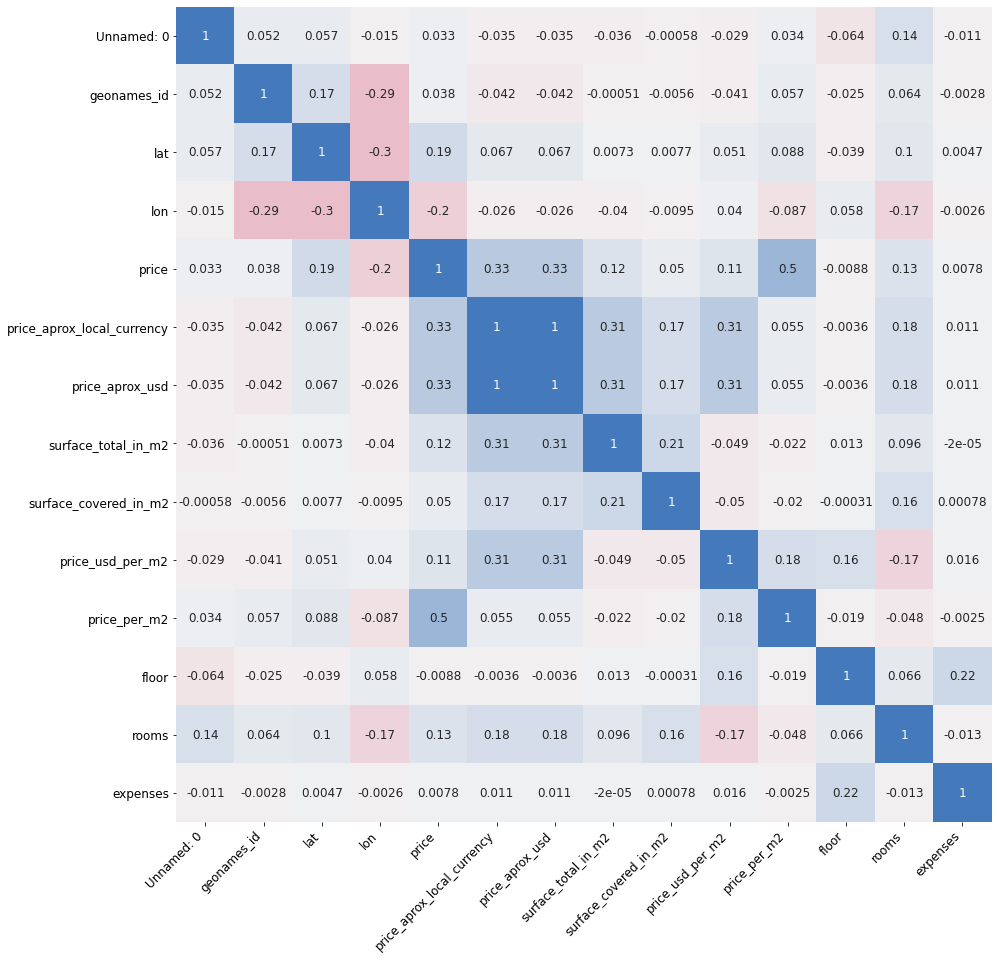

In [15]:
# Heatmap matriz de correlaciones
# ==============================================================================
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))

sns.heatmap(
    data.corr(),
    annot     = True,
    cbar      = False,
    annot_kws = {"size": 12},
    vmin      = -0.3,
    vmax      = 1,
    center    = 0,
    cmap      = sns.diverging_palette(0, 250, n=100),
    #cmap      = sns.color_palette("vlag", as_cmap=False),
    square    = True,
    ax        = ax
)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation = 45,
    horizontalalignment = 'right',
)

ax.tick_params(labelsize = 12)

**EXPLORACIÓN DE VARIABLES NO NUMÉRICAS**

In [16]:
columns_list = ['operation', 'property_type', 'place_name',
       'place_with_parent_names', 'country_name', 'state_name', 'currency',
       ]
for column in columns_list:
    print(column,data[column].unique())
    print("-" * 100)

operation ['sell']
----------------------------------------------------------------------------------------------------
property_type ['PH' 'apartment' 'house' 'store']
----------------------------------------------------------------------------------------------------
place_name ['Mataderos' 'La Plata' 'Liniers' ... 'Laguna Paiva' 'Malabrigo'
 'Altos de Hudson I']
----------------------------------------------------------------------------------------------------
place_with_parent_names ['|Argentina|Capital Federal|Mataderos|'
 '|Argentina|Bs.As. G.B.A. Zona Sur|La Plata|'
 '|Argentina|Capital Federal|Liniers|' ...
 '|Argentina|Santa Fe|Laguna Paiva|' '|Argentina|Santa Fe|Malabrigo|'
 '|Argentina|Bs.As. G.B.A. Zona Sur|Berazategui|Altos de Hudson I|']
----------------------------------------------------------------------------------------------------
country_name ['Argentina']
----------------------------------------------------------------------------------------------------
state_na

<a id="section_analisis_datos"></a> 
### 5. Análisis de Datos


#### a) Viendo los datos con mayor profundidad: "Property_type" y "currency"
Se realiza entonces el análisis de los datos utilizando diferentes metodologías como el ploteo de variables, en este caso incial, para **Property_type** y **Currency**


In [17]:
property_type_store_mask = data['property_type'] == 'store'
property_type_store = data.loc[property_type_store_mask]
print(len(property_type_store))

4072


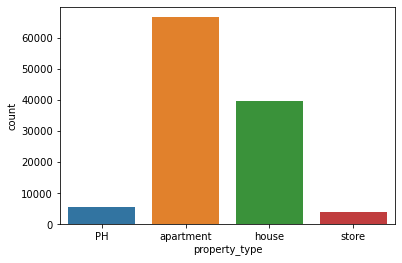

In [18]:
ax = sns.countplot(x="property_type", data=data)

In [19]:
currency_PEN_mask = data.currency == 'PEN'
currency_PEN = data.loc[currency_PEN_mask]
print(len(currency_PEN ))
currency_UYU_mask = data.currency == 'UYU'
currency_UYU = data.loc[currency_UYU_mask]
print(len(currency_UYU))

2
1


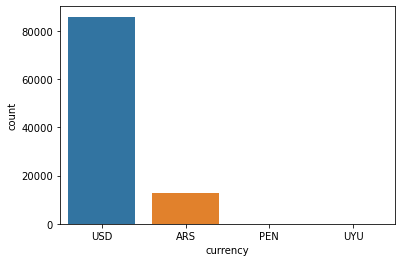

In [20]:
ax1 = sns.countplot(x="currency", data=data)

----------------------
#### b) Detección de Datos Erróneos
Se analizan los posibles errores que puede llegar a haber en el dataset. Por ejemplo, la superficie total no puede ser menor que la cubierta. 

In [21]:
print("Muestra de M2 con superficie total menor que superficie cubierta")
display(data.loc[(data.surface_total_in_m2 < data.surface_covered_in_m2),["surface_total_in_m2","surface_covered_in_m2"]])

Muestra de M2 con superficie total menor que superficie cubierta


,surface_total_in_m2,surface_covered_in_m2
78,261.0,18615.0
177,420.0,450.0
316,125.0,156.0
455,170.0,430.0
668,180.0,230.0
...,...,...
120168,120.0,140.0
120181,153.0,226.0
120202,70.0,200.0
120302,1200.0,12000.0


**CONCLUSIÓN:** Se suponen que las cifras atípicas se han cargado de manera errónea por lo que se procede a hacer la correspondiente corrección.

In [22]:
wrong_surface_load = data.loc[(data.surface_total_in_m2 < data.surface_covered_in_m2),\
                              ["surface_total_in_m2","surface_covered_in_m2"]]
data.at[wrong_surface_load.index, "surface_total_in_m2"] = wrong_surface_load["surface_covered_in_m2"]
data.at[wrong_surface_load.index, "surface_covered_in_m2"] = wrong_surface_load["surface_total_in_m2"]

--------------------------
#### c) Observación de los Precios de las Propiedades
Se revisa que el tipo de cambio entre USD y ARS sea constante en los diferentes registros. 

In [23]:
tipo_de_cambio_usd = pd.Series(data['price_aprox_local_currency']/data['price_aprox_usd'])  
tipo_de_cambio_usd.dropna().value_counts()
tipo_de_cambio_usd.dropna().round(2).unique()

array([17.64])

**CONCLUSIÓN:** El tipo de cambio entre USD y ARS se mantiene constante.

--------------------------
#### d) Eliminación de tipos de monedas no comparables
Se observa que aparte de USD y ARS en el dataset se encuentran divisas de diferentes países. 

In [24]:
data['currency'].value_counts()

USD    85919
ARS    12661
PEN        2
UYU        1
Name: currency, dtype: int64

**CONCLUSIÓN:** Se procede a eliminar las monedas que no son comparables

In [25]:
print("Distribución de monedas antes de cambiar pesos a dolares")
data.drop(data.loc[data.currency=='PEN',:].index, inplace=True)
data.drop(data.loc[data.currency=='UYU',:].index, inplace=True)
data['currency'].value_counts()

Distribución de monedas antes de cambiar pesos a dolares


USD    85919
ARS    12661
Name: currency, dtype: int64

In [26]:
display(data.loc[data.currency=='ARS', ['price','price_aprox_usd']].notnull().sum())
# Con esto vemos que podemos unificar que "price" esté en una moneda única.
data.loc[(data.currency=='ARS'), 'price'] = data.loc[(data.currency=='ARS'), 'price_aprox_usd']
data.loc[(data.currency=='ARS'), 'currency'] = 'USD'
print("Distribución de monedas despues de cambiar pesos a dolares")
display(data['currency'].value_counts())

price              12661
price_aprox_usd    12661
dtype: int64

Distribución de monedas despues de cambiar pesos a dolares


USD    98580
Name: currency, dtype: int64

--------------------------
#### e) Observación de las Superficies de las Propiedades
Se crea una variable llamada "sup_calc" a partir del precio de la superficie "price_aprox_usd" y "'price_usd_per_m2'" y se observa qué correlacion tiene la misma con la superficie total **(surface_total_in_m2)** y superficie cubierta **(surface_covered_in_m2)**.

<AxesSubplot:title={'center':'Relación Precio vs Superficie (Cubierta y Total)'}>

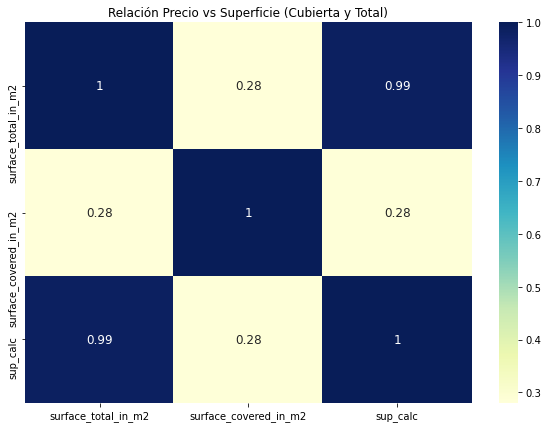

In [27]:
df_1 = data[['price_aprox_usd','price_usd_per_m2','surface_total_in_m2','surface_covered_in_m2']].copy()
df_1['sup_calc'] = df_1['price_aprox_usd'] / df_1['price_usd_per_m2']
plt.figure(figsize=(10,7))
plt.title('Relación Precio vs Superficie (Cubierta y Total)')
sns.heatmap(df_1[['surface_total_in_m2','surface_covered_in_m2','sup_calc']].corr(), \
            annot=True, annot_kws={"size": 12}, cmap="YlGnBu")

**CONCLUSION:** Se recomienda que el dato de superficie con la cual se debería centrar el análisis es con la superficie total **(surface_total_in_m2)**.

**HIPÓTESIS:** Obtener valores de Superficie Total (para imputar en valores nulos), calculandola a partir de  
valores existentes de "precio en dólares" y "precio por m2"

In [28]:
df_2 = data.loc[(~data['price_aprox_usd'].isnull()) &
               (~data['price_usd_per_m2'].isnull())]
nan_mask = df_2['surface_total_in_m2']== np.nan
print("Valores de superficie_total en Nan, con datos de price_aprox_usd y price_usd_per_m2:",nan_mask.sum())
print("-"*90)
ceros_mask = df_2['surface_total_in_m2']== 0
print("Valores de superficie_total en cero (0), con datos de price_aprox_usd y price_usd_per_m2: ",ceros_mask.sum())


Valores de superficie_total en Nan, con datos de price_aprox_usd y price_usd_per_m2: 0
------------------------------------------------------------------------------------------
Valores de superficie_total en cero (0), con datos de price_aprox_usd y price_usd_per_m2:  0


**CONCLUSIÓN:** Hipótesis No válida, ya que no exiten valores nulos o con valor cero que se puedan reeemplazar desde las variables propuestas.

--------------------------
#### f) Observación de los Ambientes de las Propiedades
Se recurre a regex para tratar de traer valores de la culmna **title** que  puedan servir para una posterior imputación.

In [29]:
pattern_ambientes = r'\b(\d{1,2})\s*amb'
data['amb_title'] = data.title.str.extract(pattern_ambientes, re.IGNORECASE, expand=True).astype(np.float)

print("Datos nulos de Ambientes extraidos de 'Title':",data['amb_title'].isnull().sum())

data['amb_description'] = data.description.str.extract(pattern_ambientes, re.IGNORECASE, expand=True)
print("-"*114)
print("Datos nulos de Ambientes extraidos de 'Description':",data['amb_description'].isnull().sum())
print("-"*125)
print ("Valores únicos de Ambientes extraídos de 'Title':",
       (data.loc[~(data['amb_title'].isnull())].filter(['amb_title']).sort_values('amb_title').amb_title.unique()))
print("-"*114)
print ("Valores únicos de Ambientes extraídos de 'Description':",
       data.loc[~(data['amb_description'].isnull())].filter(['amb_description']).sort_values('amb_description')\
         .amb_description.unique())
print("-"*114)


Datos nulos de Ambientes extraidos de 'Title': 94669
------------------------------------------------------------------------------------------------------------------
Datos nulos de Ambientes extraidos de 'Description': 80032
-----------------------------------------------------------------------------------------------------------------------------
Valores únicos de Ambientes extraídos de 'Title': [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 14. 15.]
------------------------------------------------------------------------------------------------------------------
Valores únicos de Ambientes extraídos de 'Description': ['00' '1' '10' '11' '12' '14' '16' '17' '18' '2' '20' '22' '23' '24' '25'
 '28' '3' '32' '36' '37' '4' '5' '50' '53' '6' '65' '7' '70' '75' '8' '84'
 '9' '90']
------------------------------------------------------------------------------------------------------------------


**CONCLUSIÓN:** Como es muy poco probable encontrar propiedades que tengan 90 ambientes, se utilizará la columna **amb_title** para la obtención de **ambientes**.

--------------------------
#### g) Observación de los Dormitorios de las Propiedades
Se crea una expresión regular y extraemos los dormitorios de las columnas "title" y "description"

In [30]:
pattern_dorm = r'\b(\d{1,2})\s*dorm'
data['dorm_title'] = data.title.str.extract(pattern_dorm, re.IGNORECASE, expand=True).astype(np.float)
data['dorm_title'].value_counts()

print("Datos nulos de Dormitorios extraidos de 'Title':",data['dorm_title'].isnull().sum())
print("-"*114)
data['dorm_description'] = data.description.str.extract(pattern_dorm, re.IGNORECASE, expand=True)
print("Datos nulos de Dormitorios extraidos de 'Description':", 
      data['dorm_description'].isnull().sum() )
print("-"*114)
print ("Valores únicos de Dormitorios extraídos de 'Title':", 
       data.loc[~(data['dorm_title'].isnull())].filter(['dorm_title']).sort_values('dorm_title').dorm_title.unique())
print("-"*114)
print ("Valores únicos de Dormitorios extraídos de 'Description':", 
       data.loc[~(data['dorm_description'].isnull())].filter(['dorm_description']).sort_values('dorm_description')\
         .dorm_description.unique())


Datos nulos de Dormitorios extraidos de 'Title': 108849
------------------------------------------------------------------------------------------------------------------
Datos nulos de Dormitorios extraidos de 'Description': 77101
------------------------------------------------------------------------------------------------------------------
Valores únicos de Dormitorios extraídos de 'Title': [ 1.  2.  3.  4.  5.  6.  7.  9. 10.]
------------------------------------------------------------------------------------------------------------------
Valores únicos de Dormitorios extraídos de 'Description': ['0' '00' '02' '03' '04' '05' '1' '10' '11' '13' '14' '15' '18' '2' '20'
 '22' '24' '25' '27' '3' '30' '32' '33' '34' '35' '4' '40' '41' '42' '43'
 '44' '45' '48' '5' '50' '51' '52' '53' '54' '57' '6' '60' '62' '65' '7'
 '70' '72' '74' '75' '76' '77' '78' '8' '80' '83' '84' '85' '87' '9' '90'
 '93' '95']


**CONCLUSIÓN:** Como es muy poco probable encontrar propiedades que tengan 95 dormitorios, se utilizará la columna **dorm_title** para la obtención de **dormitorios**.

#### h) Analisis de "place_name"

In [31]:
#Vemos que place_name tiene 23 datos faltantes
print(data.place_name.isnull().sum())
# Generamos una mascara para detectarlos
place_name_null_mask = data.place_name.isnull()
data[place_name_null_mask]
# Vemos que corresponden a valores del partido de Tigre
#Reemplazamos con un apply los valores nulos por la localidad correspondiente.
data['place_name'] = data.place_name.apply(lambda x: "Tigre" if x is np.NaN else x)
data['place_name'].replace("coordenadas 34.255511","Tigre", inplace=True)
print(data.place_name.isnull().sum()) 

23
0


#### i) Analisis de "geonames_id"

In [32]:
# Vemos los datos faltantes que tiene
print(data.geonames_id.isnull().sum())

#Rellenamos los valores de geonames_id con los valores que ya tengo, 
# provenientes de'place_name' y 'state_name'.
# Creamos una variable nueva a partir de las 2 variables nombradas anteriormente
data["place_state_name"] = data.place_name + "_" + data.state_name
data.head(3)
# Localizamos los valores no nulos de "geonames_id" y los ordenamos por "place_state_name", 
# Luego hacemos un diccionario para mapear.
df_1 = data.loc[data.geonames_id.notnull()].sort_values(by="place_state_name", ascending=False)
diccionario = dict(zip(df_1.place_state_name,df_1.geonames_id))
# En los lugares nulos de "geonames_id" lo imputamos mapeando con el diccionario armado
data.geonames_id= data.geonames_id.fillna(data.place_state_name.map(diccionario))
print(data.geonames_id.isnull().sum()) 

18180
13900


#### j) Analisis de "state_name"

In [33]:
#VEMOS QUE LOS PRIMEROS 7 REPRESENTAN CASI EL 93% DE LOS DATOS.
mascara = data.state_name.value_counts().head(7)
print(mascara)
print(mascara.sum())
print(mascara.sum()/data.shape[0]*100)
data["state_name1"] = data.state_name.apply(lambda x: x if x in mascara else "Otros")
print(data["state_name1"].unique())
dfx = data.state_name1.value_counts().reset_index()
dfx.columns = ['Barrio', 'Cantidad']
dfx["% total"] = round(dfx["Cantidad"]/dfx["Cantidad"].sum()*100,2)
dfx

Capital Federal                 30743
Bs.As. G.B.A. Zona Norte        24768
Bs.As. G.B.A. Zona Sur          13557
Córdoba                         11585
Buenos Aires Costa Atlántica     9914
Bs.As. G.B.A. Zona Oeste         9048
Santa Fe                         9034
Name: state_name, dtype: int64
108649
93.55244237409266
['Capital Federal' 'Bs.As. G.B.A. Zona Sur' 'Buenos Aires Costa Atlántica'
 'Otros' 'Bs.As. G.B.A. Zona Norte' 'Santa Fe' 'Córdoba'
 'Bs.As. G.B.A. Zona Oeste']


,Barrio,Cantidad,% total
0,Capital Federal,30743,26.47
1,Bs.As. G.B.A. Zona Norte,24768,21.33
2,Bs.As. G.B.A. Zona Sur,13557,11.67
3,Córdoba,11585,9.98
4,Buenos Aires Costa Atlántica,9914,8.54
5,Bs.As. G.B.A. Zona Oeste,9048,7.79
6,Santa Fe,9034,7.78
7,Otros,7488,6.45


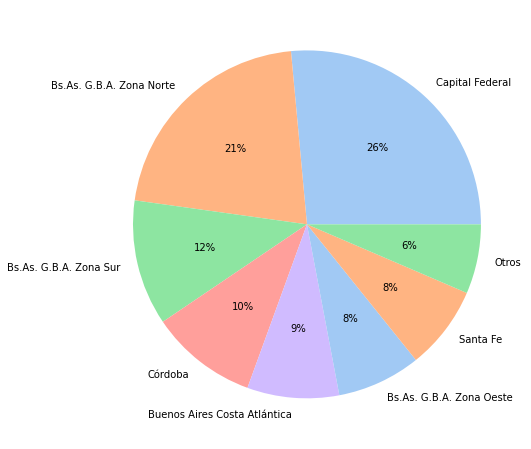

In [34]:
fig= plt.figure(figsize=(15,8))
colors = sns.color_palette('pastel')[0:5]
plt.pie(x= dfx["% total"], labels =dfx.Barrio, colors = colors, autopct='%.0f%%')
plt.show()

In [35]:
borrar_columna(data, 'state_name1')

Eliminando columna: state_name1
Lista de columnas eliminadas: ['state_name1']
----------------------------------------------------------------------------------------------------


#### k) Analisis de "Amenities"

In [36]:
pattern = "balcón"
regex_pattern = re.compile(pattern, re.IGNORECASE)
cadena_reemplazo= "balcon"
data.description = data.description.apply(lambda x: x if x is np.NaN else regex_pattern.sub(cadena_reemplazo,x))

In [37]:
lista_atributos=['jardin','cochera','seguridad',"parrilla",'pileta','terraza','subte','lavadero',"quincho", 
                 "balcon", "gimnasio", 'nuevo','nueva','estrenar', 'estacionamiento', 'parking', 'sum', 'vista','gym',
                'vestidor', 'moderno', 'solarium', 'patio']

for i in lista_atributos:
    atributos=i
    regex_atributo= re.compile(atributos,re.IGNORECASE )
    matches_atributos = data.description.apply(lambda x: x if x is np.NaN else regex_atributo.search(x))
    print(i , matches_atributos.notnull().sum())
    data[i]= matches_atributos.notnull().astype(int)

jardin 7553
cochera 40482
seguridad 10737
parrilla 32702
pileta 18410
terraza 26216
subte 7243
lavadero 37270
quincho 12715
balcon 40588
gimnasio 6491
nuevo 7395
nueva 4784
estrenar 10225
estacionamiento 2025
parking 455
sum 14246
vista 23245
gym 2270
vestidor 17494
moderno 4536
solarium 9422
patio 21177


In [38]:
# Borraremos las amenities con cantidad de valores menor a 10000.
borrar_columna(data,'jardin')
borrar_columna(data,'subte')
borrar_columna(data,'gimnasio')
borrar_columna(data,'nuevo')
borrar_columna(data,'nueva')
borrar_columna(data,'estacionamiento')
borrar_columna(data,'parking')
borrar_columna(data,'gym')
borrar_columna(data,'moderno')
borrar_columna(data,'solarium')
obtener_info_data(data)

Eliminando columna: jardin
Lista de columnas eliminadas: ['state_name1', 'jardin']
----------------------------------------------------------------------------------------------------
Eliminando columna: subte
Lista de columnas eliminadas: ['state_name1', 'jardin', 'subte']
----------------------------------------------------------------------------------------------------
Eliminando columna: gimnasio
Lista de columnas eliminadas: ['state_name1', 'jardin', 'subte', 'gimnasio']
----------------------------------------------------------------------------------------------------
Eliminando columna: nuevo
Lista de columnas eliminadas: ['state_name1', 'jardin', 'subte', 'gimnasio', 'nuevo']
----------------------------------------------------------------------------------------------------
Eliminando columna: nueva
Lista de columnas eliminadas: ['state_name1', 'jardin', 'subte', 'gimnasio', 'nuevo', 'nueva']
-----------------------------------------------------------------------------------

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
Unnamed: 0,0,116137,0.0,100.0,int64
operation,0,116137,0.0,100.0,object
property_type,0,116137,0.0,100.0,object
place_name,0,116137,0.0,100.0,object
place_with_parent_names,0,116137,0.0,100.0,object
country_name,0,116137,0.0,100.0,object
state_name,0,116137,0.0,100.0,object
geonames_id,13900,102237,12.0,88.0,float64
lat-lon,48286,67851,41.6,58.4,object
lat,48286,67851,41.6,58.4,float64


#### l) Analisis de "Ubicaciones lat-lon"

In [39]:
# Descargamos de acá: https://download.geonames.org/export/dump/ la base de datos de geonames de argentina
#Leemos la base de datos
geo_column_names = ["geonameid","name","asciiname","alternatenames","lat","lon",
                    "feature class","feature code","country code","cc2",
                    "admin1 code","admin2 code","admin3 code","admin4 code","population",
                    "elevation","dem","timezone","modification date"]
geo = pd.read_csv("AR.txt",sep='\t',index_col=0,names=geo_column_names,)

# Muestra de datos relevantes
print("Shape de la base de datos: {}".format(geo.shape))
print("Muestra de datos de la DB de geonames")
display(geo[["name","lat","lon"]].sample(5))
# Joineamos las tablas por el id de geoname
data=data.join(geo[["lat","lon"]],on="geonames_id",rsuffix="_geo")

# Imprimo resultados encontrados
print("")
print("Encontramos datos de latitud y longitud que no teniamos para {} observaciones".format(data.loc[(data["lat"].isnull()) & (~data["lat_geo"].isnull())].shape[0]))
print("No pudimos encontrar nuevos datos de latitud y longitud para {} observaciones".format(data.loc[(~data["lat"].isnull()) & (data["lat_geo"].isnull())].shape[0]))
print("Nuestro Dataset original podria quedar solo con {} observaciones sin latitud y longitud".format(data.loc[(data["lat"].isnull()) & (data["lat_geo"].isnull())].shape[0]))
print("")


data.loc[(~data["lat"].isnull()) & (~data["lat_geo"].isnull()),["place_with_parent_names","geonames_id","lat-lon","lat","lon","lat_geo","lon_geo"]].sample(10)

Shape de la base de datos: (49698, 18)
Muestra de datos de la DB de geonames


,name,lat,lon
geonameid,,,
11980113,Muelle de Servicios,-38.79190,-62.26218
3863302,Cerro Campamento,-22.48333,-64.86667
11152123,Tambo B. Fourcade,-34.83496,-58.67551
3847783,Las Talas,-30.75589,-64.21588
3434917,Almacén El Arazá,-35.36667,-59.06667



Encontramos datos de latitud y longitud que no teniamos para 42323 observaciones
No pudimos encontrar nuevos datos de latitud y longitud para 8387 observaciones
Nuestro Dataset original podria quedar solo con 5963 observaciones sin latitud y longitud



,place_with_parent_names,geonames_id,lat-lon,lat,lon,lat_geo,lon_geo
86478,|Argentina|Capital Federal|Monserrat|,3430570.0,"-34.6085949731,-58.3833645954",-34.608595,-58.383365,-34.61237,-58.38341
111509,|Argentina|Buenos Aires Interior|Campana|,3435809.0,"-34.1749322,-58.9579679",-34.174932,-58.957968,-34.16667,-58.91667
16952,|Argentina|Entre Ríos|Paraná|,3430146.0,"-31.7215489,-60.5206775",-31.721549,-60.520678,-31.66667,-60.00000
27051,|Argentina|Bs.As. G.B.A. Zona Oeste|Hurlingham...,3433522.0,"-34.5956603,-58.6260974",-34.595660,-58.626097,-34.59040,-58.62904
49391,|Argentina|Capital Federal|Palermo|,3430234.0,"-34.5730578002,-58.4191981846",-34.573058,-58.419198,-34.58856,-58.43053
58668,|Argentina|Buenos Aires Costa Atlántica|Mar de...,3430863.0,"-37.9886269,-57.5467098",-37.988627,-57.546710,-38.00042,-57.55620
37594,|Argentina|Capital Federal|Constitución|,3435257.0,"-34.6187291173,-58.3859288692",-34.618729,-58.385929,-34.62593,-58.38633
18665,|Argentina|Buenos Aires Costa Atlántica|Villa ...,3427431.0,"-37.2443170562,-56.9594031036",-37.244317,-56.959403,-37.26394,-56.97304
113066,|Argentina|Bs.As. G.B.A. Zona Oeste|Morón|Vill...,3427367.0,"-34.6407326,-58.5720625",-34.640733,-58.572063,-34.70125,-58.38319
50426,|Argentina|Capital Federal|Belgrano|,3436077.0,"-34.5662123,-58.4393342",-34.566212,-58.439334,-34.56270,-58.45829


In [40]:
# VEMOS VALORES NULOS DE LAT Y LON
obtener_info_data(data)

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
Unnamed: 0,0,116137,0.0,100.0,int64
operation,0,116137,0.0,100.0,object
property_type,0,116137,0.0,100.0,object
place_name,0,116137,0.0,100.0,object
place_with_parent_names,0,116137,0.0,100.0,object
country_name,0,116137,0.0,100.0,object
state_name,0,116137,0.0,100.0,object
geonames_id,13900,102237,12.0,88.0,float64
lat-lon,48286,67851,41.6,58.4,object
lat,48286,67851,41.6,58.4,float64


In [41]:
# IMPUTAMOS LOS VALORES FALTANTES DE LAT Y LONG CON LOS NUEVOS VALOERES OBTENIDOS DE LA BASE DE DATOS EXTERNA
data.loc[(data.lat.isnull()) & (data.lat_geo.notnull()), 'lat'] = data.lat_geo
data.loc[(data.lon.isnull()) & (data.lon_geo.notnull()), 'lon'] = data.lon_geo

In [42]:
obtener_info_data(data)

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
Unnamed: 0,0,116137,0.0,100.0,int64
operation,0,116137,0.0,100.0,object
property_type,0,116137,0.0,100.0,object
place_name,0,116137,0.0,100.0,object
place_with_parent_names,0,116137,0.0,100.0,object
country_name,0,116137,0.0,100.0,object
state_name,0,116137,0.0,100.0,object
geonames_id,13900,102237,12.0,88.0,float64
lat-lon,48286,67851,41.6,58.4,object
lat,5963,110174,5.1,94.9,float64


In [43]:
# ELIMINAMOS LAS 2 COLUMNAS NUEVAS QUE SE CREARON
borrar_columna(data,'lat_geo')
borrar_columna(data,'lon_geo')

Eliminando columna: lat_geo
Lista de columnas eliminadas: ['state_name1', 'jardin', 'subte', 'gimnasio', 'nuevo', 'nueva', 'estacionamiento', 'parking', 'gym', 'moderno', 'solarium', 'lat_geo']
----------------------------------------------------------------------------------------------------
Eliminando columna: lon_geo
Lista de columnas eliminadas: ['state_name1', 'jardin', 'subte', 'gimnasio', 'nuevo', 'nueva', 'estacionamiento', 'parking', 'gym', 'moderno', 'solarium', 'lat_geo', 'lon_geo']
----------------------------------------------------------------------------------------------------


In [44]:
#data = data.dropna(subset=["lat"])
#data = data.dropna(subset=["lon"])
#obtener_info_data(data)

<a id="section_imputacion_datos"></a> 
### 6. Imputación de Datos


#### a) Imputación de Variable "Rooms"
Se crea una nueva variable llamada "rooms_clean", se copian los valores existentes de "rooms" y se imputan los valores extraídos vía regex de **dorm_title**.


In [45]:
data['rooms_clean'] = data.rooms.copy()
data.loc[(data.dorm_title.notnull()) & (data.rooms_clean.isnull()), 'rooms_clean'] = data.dorm_title
data.head()

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,...,place_state_name,cochera,seguridad,parrilla,pileta,terraza,lavadero,quincho,balcon,estrenar,sum,vista,vestidor,patio,rooms_clean
0,0,sell,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,-58.508839,62000.0,USD,1093959.0,62000.0,...,Mataderos_Capital Federal,0,0,0,0,0,1,0,0,0,0,0,0,1,NaN
1,1,sell,apartment,La Plata,|Argentina|Bs.As. G.B.A. Zona Sur|La Plata|,Argentina,Bs.As. G.B.A. Zona Sur,3432039.0,"-34.9038831,-57.9643295",-34.903883,-57.964330,150000.0,USD,2646675.0,150000.0,...,La Plata_Bs.As. G.B.A. Zona Sur,1,0,0,0,0,1,0,1,1,0,0,0,0,2.0
2,2,sell,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,-58.522982,72000.0,USD,1270404.0,72000.0,...,Mataderos_Capital Federal,0,0,0,0,0,1,0,0,0,0,0,0,0,NaN
3,3,sell,PH,Liniers,|Argentina|Capital Federal|Liniers|,Argentina,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,-58.516424,95000.0,USD,1676227.5,95000.0,...,Liniers_Capital Federal,0,0,0,0,0,0,0,0,0,0,0,0,1,NaN
4,4,sell,apartment,Centro,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,3435548.0,"-38.0026256,-57.5494468",-38.002626,-57.549447,64000.0,USD,1129248.0,64000.0,...,Centro_Buenos Aires Costa Atlántica,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN


In [46]:
obtener_info_data(data)

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
Unnamed: 0,0,116137,0.0,100.0,int64
operation,0,116137,0.0,100.0,object
property_type,0,116137,0.0,100.0,object
place_name,0,116137,0.0,100.0,object
place_with_parent_names,0,116137,0.0,100.0,object
country_name,0,116137,0.0,100.0,object
state_name,0,116137,0.0,100.0,object
geonames_id,13900,102237,12.0,88.0,float64
lat-lon,48286,67851,41.6,58.4,object
lat,5963,110174,5.1,94.9,float64


**CONCLUSIÓN:** Se observa que la cantidad de valores nulos en la variable **rooms** mejora de un 60,2% a un 57.1% utilizando **rooms_clean** lo cual no es significativo.

--------------------------------
Teniendo en cuenta la conclusión anterior, se crea una tabla para verificar si el valor de **Ambiente**  puede utilizarse para imputar como valor en **rooms_clean**.

Para esto: 
- se arma un MiniDF con valores de ambientes y rooms_clean no nulos
- se crea una variable Cond_Igualdad y le asignamos el valor 0.
- Dentro del nuevo DF creado se identifican los casos donde los valores de ambas columnas coincidan y le asignamos el valor 1


In [47]:
df_amb_rooms = data.loc[(data.amb_title.notnull()) & (data.rooms_clean.notnull())]
df_amb_rooms['cond_igualdad'] = 0
cond_igualdad_mask = df_amb_rooms.amb_title == df_amb_rooms.rooms_clean
df_amb_rooms.loc[cond_igualdad_mask, 'cond_igualdad' ] = 1
df_amb_rooms.filter(items=['amb_title', 'rooms_clean', 'cond_igualdad'])
print(df_amb_rooms.shape[0])
print(df_amb_rooms.cond_igualdad.sum())
casos_verifican_perc = round(100 * df_amb_rooms.cond_igualdad.sum()/ df_amb_rooms.shape[0],2)
print('Casos que verifican: ',casos_verifican_perc, '%')

13008
12316
Casos que verifican:  94.68 %


**CONCLUSIÓN:** Se observa que en el 94.7% de los casos, los valores de ambiente coinciden con los de rooms, por lo tanto, se utilizan los mismos para ser imputados en rooms.

-------------------------------------

In [48]:
display(df_amb_rooms.filter(items=['amb_title', 'rooms_clean', 'cond_igualdad']))

,amb_title,rooms_clean,cond_igualdad
16,4.0,4.0,1
17,3.0,3.0,1
21,4.0,4.0,1
24,4.0,4.0,1
25,4.0,4.0,1
...,...,...,...
120178,2.0,2.0,1
120182,3.0,3.0,1
120203,2.0,2.0,1
120204,1.0,1.0,1


***Test de Hipótesis para confirmar la imputación***

El procedimiento Prueba T para muestras independientes debe utilizarse para comparar las medias de dos grupos de casos, es decir,  cuando la comparación se realice entre las medias de dos poblaciones independientes (los individuos de una de las poblaciones son distintos a los individuos de la otra) como, por ejemplo, en el caso de la comparación de las poblaciones de hombres y mujeres.  Lo ideal es que para esta prueba los sujetos se asignen aleatoriamente a dos grupos.


Para realizar esta prueba de hipótesis se recomienda seguir el siguiente procedimiento: 

1. Cálculo de estadísticos descriptivos: Los estadísticos descriptivos resumen lo relevante de los datos en términos de tendencia central, variabilidad y forma de la distribución. Normalmente, se calcula la media, desviación estándar, coeficiente de variación, error estándar y los coeficientes de asimetría y curtosis. 

2. Análisis gráfico: El objetivo del análisis gráfico es detectar patrones o tendencias en el set de datos. Por ejemplo, se puede analizar la tendencia central, la variabilidad y la forma de la distribución que caracteriza al set de datos.


3. Prueba de hipótesis: Una vez familiarizado con el set de datos proceder a realizar la prueba de hipótesis. El proceso involucra los siguientes pasos: A)  Plantear la hipótesis nula y alternativa. B) Seleccionar el estadístico de prueba y definir el nivel de significancia. Si se opta por una prueba paramétrica se debe: a. Realizar una prueba sobre normalidad de ambos sets de datos. b. Realizar una prueba de igualdad de varianzas para luego elegir entre una prueba de hipótesis con varianzas iguales o diferentes. C) Efectuar la prueba de hipótesis. D) Tomar una decisión.

Antes de realizar cualquier análisis se grafican los datos provenientes de ambas poblaciones.

Media de Ambientes:2.8226,      
Desviacion de Ambientes:1.1259,      
Media de Rooms:2.8196,      
Desviacion de Rooms:1.1822


<AxesSubplot:xlabel='rooms_clean', ylabel='Density'>

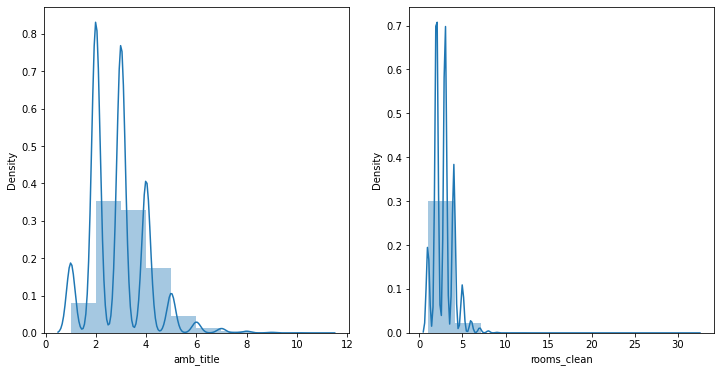

In [49]:
mean_amb_title = np.round(np.mean(df_amb_rooms.amb_title),4)
sd_amb_title = np.round(np.std(df_amb_rooms.amb_title),4)

mean_rooms_clean = np.round(np.mean(df_amb_rooms.rooms_clean),4)
sd_rooms_clean = np.round(np.std(df_amb_rooms.rooms_clean),4)

print(f'Media de Ambientes:{mean_amb_title},\
      \nDesviacion de Ambientes:{sd_amb_title},\
      \nMedia de Rooms:{mean_rooms_clean},\
      \nDesviacion de Rooms:{sd_rooms_clean}') 

fig, axs = plt.subplots(ncols=2, figsize=(12,6))
sns.distplot(df_amb_rooms.amb_title, ax=axs[0], label='Ambientes',bins=10)
sns.distplot(df_amb_rooms.rooms_clean, ax=axs[1], label='Rooms',bins=10)

<AxesSubplot:xlabel='rooms_clean', ylabel='Density'>

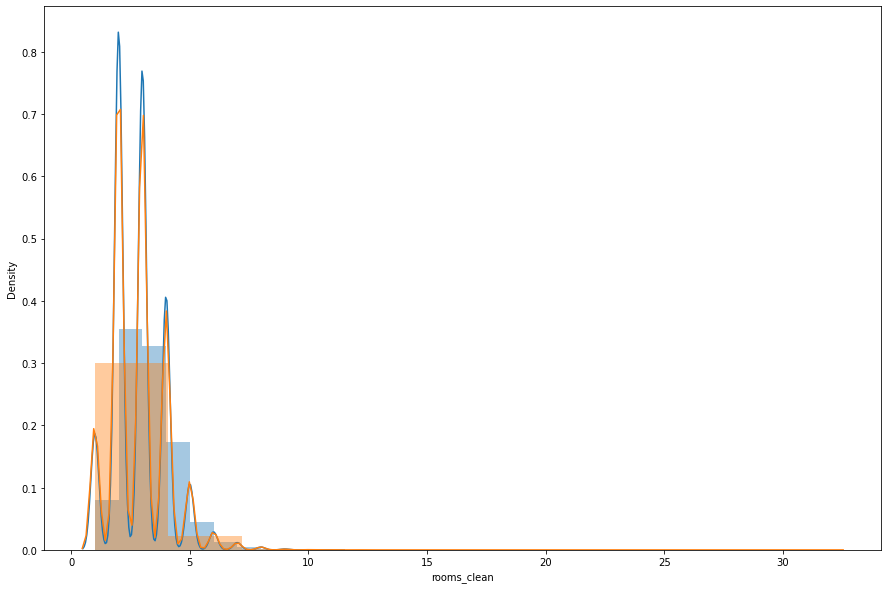

In [50]:
plt.figure(figsize=(15,10))
sns.distplot(df_amb_rooms.amb_title, label='Ambientes', bins=10)
sns.distplot(df_amb_rooms.rooms_clean, label='Rooms', bins=10)

**CONCLUSIÓN:** Viendo los gráficos anteriores y a partir de los cálculos obtenidos, se observa que ambas distribucuiones parecieran tener medias y densidades similares, sin poder garantizar normalidad en dichas distribuciones.

Se toma como grupo de control, el grupo de la población, habitaciones ("rooms_clean") y el de tratamiento será el de la población cantidad de ambientes ("amb_title"). Para esto se realizarán dos pruebas:
 - Prueba de igualdad de Varianzas
 - Prueba de igualdad de Medias
 
 
Se especifica una hipótesis nula, aquí se propone que las medias de las dos poblaciones son iguales y se establece la hipótesis alternativa (bilateral). 

• Se especifica un nivel de significación α 

• Se calcula el p-valor . : la probabilidad de obtener datos cuyas medias muestrales difieren tanto o más que la diferencia observada cuando H0 es verdadera. Si esta probabilidad es pequeña (menor que  α ) se rechaza H0 y se concluye que la diferencia observada no es atribuible al azar y las medias de las dos poblaciones son diferentes. 

Resumiendo el planteo sería el siguiente:

**Ho: µ1 = µ2**

**Ha: µ1 ≠ µ2**  

Se fija entonces un nivel de significancia α=0.05, haciendo un test de dos colas α/2=0.025, y se define la siguiente estrategia:
 - si el p-value es menor a 0.05 se rechaza la hipotesis nula (pudiendo aceptarse Ha), 
 - caso contrario, No Existe Evidencia para rechazar la Hipótesis Nula.

In [51]:
# Realizamos la prueba de igualdad de Varianzas usando en Test de Levene, sin chequear normalidad.
levene(df_amb_rooms.amb_title, df_amb_rooms.rooms_clean)

LeveneResult(statistic=7.356147800529117, pvalue=0.006687775364861403)

**CONLUSIÓN 1:** P-value obtenido es menor que α=0.05, por lo tanto se realiza el Test sobre Igualdad de Medias, aplicando Varianzas diferentes, parámetro equal_var=False.

In [52]:
t_stat, p_val = ss.ttest_ind(df_amb_rooms.amb_title, df_amb_rooms.rooms_clean, equal_var=False)
t_stat, p_val

(0.20944322776572488, 0.8341038940517896)

**CONLUSIÓN 2:** El p-value obtenido en este caso, es mayor que α=0.05, por lo cual No Existe Evidencia para rechazar la Hipótesis Nula Ho: µ1 = µ2. Esto confirma estadísticamente, que ambas variables son fuertemente parecidas, por lo cual se procede a imputar el valor de **rooms_clean** con el correspondiente en **"amb_title"**.


------------------------------------
#### b) Imputación de Variable "Rooms" con Valores de "Ambientes"

In [53]:
data.loc[(data.amb_title.notnull()) & (data.rooms_clean.isnull()), 'rooms_clean'] = data.amb_title

Se verifica si los datos nulos disminuyeron nuevamente.

In [54]:
obtener_info_data(data)

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
Unnamed: 0,0,116137,0.0,100.0,int64
operation,0,116137,0.0,100.0,object
property_type,0,116137,0.0,100.0,object
place_name,0,116137,0.0,100.0,object
place_with_parent_names,0,116137,0.0,100.0,object
country_name,0,116137,0.0,100.0,object
state_name,0,116137,0.0,100.0,object
geonames_id,13900,102237,12.0,88.0,float64
lat-lon,48286,67851,41.6,58.4,object
lat,5963,110174,5.1,94.9,float64


***Imputaremos los valores faltantes de rooms calculando la mediana de cada tipo de propiedad y efectivizando la imputación con un Mapeo por Tipo de Propiedad.***

In [55]:
df_med_rooms = data.groupby('property_type')['rooms_clean'].median()
df_med_rooms

property_type
PH           3.0
apartment    2.0
house        4.0
store        1.0
Name: rooms_clean, dtype: float64

In [56]:
diccionario = dict(zip(data.property_type.unique(), df_med_rooms))
diccionario

{'PH': 3.0, 'apartment': 2.0, 'house': 4.0, 'store': 1.0}

In [57]:
data.rooms_clean = data.rooms_clean.fillna(data.property_type.map(diccionario))

In [58]:
obtener_info_data(data)

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
Unnamed: 0,0,116137,0.0,100.0,int64
operation,0,116137,0.0,100.0,object
property_type,0,116137,0.0,100.0,object
place_name,0,116137,0.0,100.0,object
place_with_parent_names,0,116137,0.0,100.0,object
country_name,0,116137,0.0,100.0,object
state_name,0,116137,0.0,100.0,object
geonames_id,13900,102237,12.0,88.0,float64
lat-lon,48286,67851,41.6,58.4,object
lat,5963,110174,5.1,94.9,float64


------------------------------------
#### c) Imputación de Variable "M2" (Metros Cuadrados)

Para buscar datos de Metros Cuadrados, inicialmente se realizará mediante el uso de expresiones regulares, en las columnas 
**Title** y **Description**

Se crea entonces un DF con una expresión regular y este se extrae en dos columnas diferentes los m2 de propiedades y su unidad correspondiente y se procede a pasar la columna **Cantidad** a numéricos para ser luego imputado al Dataset original.

In [59]:
df_m_title = data.title.str.extract(r'(\d+)\s(\w[2]|metros|metros Cuadrados|m²)', re.IGNORECASE)
df_m_title.columns = ['Cantidad_m2_title', 'Unidad'] 
print('Datos de m2 extraidos de "title"') 
display (df_m_title.loc[df_m_title.Cantidad_m2_title.notnull()])
data['m2_title'] = pd.to_numeric(pd.Series(df_m_title.Cantidad_m2_title))
print('Cantidad de datos No Nulos de m2 extraidos de "Title"') 
display(data['m2_title'].notnull().sum())

Datos de m2 extraidos de "title"


,Cantidad_m2_title,Unidad
67,220,m2
75,90,METROS
77,85,m2
79,42,m2
149,110,m2
...,...,...
119979,600,m2
120129,230,m2
120179,430,m2
120180,80,m2


Cantidad de datos No Nulos de m2 extraidos de "Title"


1905

In [60]:
df_m_description  = data.description.str.extract(r'(\d+)\s(\w[2]|metros|metros Cuadrados|m²)', re.IGNORECASE)
df_m_description.columns = ['Cantidad_m2_description', 'Unidad'] 
print('Datos de m2 extraidos de "description"') 
display (df_m_description.loc[df_m_description.Cantidad_m2_description.notnull()])
data['m2_description'] = pd.to_numeric(pd.Series(df_m_description.Cantidad_m2_description))
print('Cantidad de datos No Nulos de m2 extraidos de "Description"') 
display(data['m2_description'].notnull().sum())

Datos de m2 extraidos de "description"


,Cantidad_m2_description,Unidad
6,106,m2
10,1514,metros
13,30,metros
14,30,metros
18,40,m2
...,...,...
121155,130,m2
121158,45,m2
121207,210,m2
121216,572,m2


Cantidad de datos No Nulos de m2 extraidos de "Description"


24433

Tal como en el ejercicio de Rooms, se crea una nueva variable llamada **total_surface_clean**, a la cual se le copiarán los valores de "surface_total_in_m2" para luego imputarle los valores extraídos vía regex de **m2_description**

In [61]:
data['total_surface_clean'] = data.surface_total_in_m2.copy()
data.loc[(data.m2_description.notnull()) & (data.total_surface_clean.isnull()), 'total_surface_clean'] = data.m2_description
data.head()

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,...,parrilla,pileta,terraza,lavadero,quincho,balcon,estrenar,sum,vista,vestidor,patio,rooms_clean,m2_title,m2_description,total_surface_clean
0,0,sell,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,-58.508839,62000.0,USD,1093959.0,62000.0,...,0,0,0,1,0,0,0,0,0,0,1,2.0,NaN,NaN,55.0
1,1,sell,apartment,La Plata,|Argentina|Bs.As. G.B.A. Zona Sur|La Plata|,Argentina,Bs.As. G.B.A. Zona Sur,3432039.0,"-34.9038831,-57.9643295",-34.903883,-57.964330,150000.0,USD,2646675.0,150000.0,...,0,0,0,1,0,1,1,0,0,0,0,2.0,NaN,NaN,NaN
2,2,sell,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,-58.522982,72000.0,USD,1270404.0,72000.0,...,0,0,0,1,0,0,0,0,0,0,0,2.0,NaN,NaN,55.0
3,3,sell,PH,Liniers,|Argentina|Capital Federal|Liniers|,Argentina,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,-58.516424,95000.0,USD,1676227.5,95000.0,...,0,0,0,0,0,0,0,0,0,0,1,3.0,NaN,NaN,NaN
4,4,sell,apartment,Centro,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,3435548.0,"-38.0026256,-57.5494468",-38.002626,-57.549447,64000.0,USD,1129248.0,64000.0,...,0,0,0,0,0,0,0,0,0,0,0,2.0,NaN,NaN,35.0


In [62]:
obtener_info_data(data)

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
Unnamed: 0,0,116137,0.0,100.0,int64
operation,0,116137,0.0,100.0,object
property_type,0,116137,0.0,100.0,object
place_name,0,116137,0.0,100.0,object
place_with_parent_names,0,116137,0.0,100.0,object
country_name,0,116137,0.0,100.0,object
state_name,0,116137,0.0,100.0,object
geonames_id,13900,102237,12.0,88.0,float64
lat-lon,48286,67851,41.6,58.4,object
lat,5963,110174,5.1,94.9,float64


**CONCLUSIÓN:** El % de valores nulos de **surface_total_in_m2** = 33% y el de **total_surface_clean**=26.4%, mejorando en un 6% los  datos faltantes por lo cual se tratará de imputar los valores faltantes con los de superficie cubierta.

In [63]:
data.loc[(data.surface_covered_in_m2 .notnull()) & (data.total_surface_clean.isnull()), 'total_surface_clean'] = \
        data.surface_covered_in_m2

In [64]:
obtener_info_data(data)

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
Unnamed: 0,0,116137,0.0,100.0,int64
operation,0,116137,0.0,100.0,object
property_type,0,116137,0.0,100.0,object
place_name,0,116137,0.0,100.0,object
place_with_parent_names,0,116137,0.0,100.0,object
country_name,0,116137,0.0,100.0,object
state_name,0,116137,0.0,100.0,object
geonames_id,13900,102237,12.0,88.0,float64
lat-lon,48286,67851,41.6,58.4,object
lat,5963,110174,5.1,94.9,float64


**CONCLUSIÓN:** El % de valores nulos continúa disminuyendo pasando de **surface_total_in_m2** = 33% a un porcentaje de  **total_surface_clean**=8.7%, por lo que se procede con la imputación de datos.

Imputamos también los valores de superficie cubierta con los valores de superficie total.

In [65]:
data['surface_covered_clean'] = data['surface_covered_in_m2'].copy()
data.loc[(data.surface_covered_clean.isnull()) & (data.total_surface_clean.notnull()), 'surface_covered_clean'] = \
        data.total_surface_clean

In [66]:
obtener_info_data(data)

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
Unnamed: 0,0,116137,0.0,100.0,int64
operation,0,116137,0.0,100.0,object
property_type,0,116137,0.0,100.0,object
place_name,0,116137,0.0,100.0,object
place_with_parent_names,0,116137,0.0,100.0,object
country_name,0,116137,0.0,100.0,object
state_name,0,116137,0.0,100.0,object
geonames_id,13900,102237,12.0,88.0,float64
lat-lon,48286,67851,41.6,58.4,object
lat,5963,110174,5.1,94.9,float64


In [67]:
data.head(5)

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,...,pileta,terraza,lavadero,quincho,balcon,estrenar,sum,vista,vestidor,patio,rooms_clean,m2_title,m2_description,total_surface_clean,surface_covered_clean
0,0,sell,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,-58.508839,62000.0,USD,1093959.0,62000.0,...,0,0,1,0,0,0,0,0,0,1,2.0,NaN,NaN,55.0,40.0
1,1,sell,apartment,La Plata,|Argentina|Bs.As. G.B.A. Zona Sur|La Plata|,Argentina,Bs.As. G.B.A. Zona Sur,3432039.0,"-34.9038831,-57.9643295",-34.903883,-57.964330,150000.0,USD,2646675.0,150000.0,...,0,0,1,0,1,1,0,0,0,0,2.0,NaN,NaN,NaN,NaN
2,2,sell,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,-58.522982,72000.0,USD,1270404.0,72000.0,...,0,0,1,0,0,0,0,0,0,0,2.0,NaN,NaN,55.0,55.0
3,3,sell,PH,Liniers,|Argentina|Capital Federal|Liniers|,Argentina,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,-58.516424,95000.0,USD,1676227.5,95000.0,...,0,0,0,0,0,0,0,0,0,1,3.0,NaN,NaN,NaN,NaN
4,4,sell,apartment,Centro,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,3435548.0,"-38.0026256,-57.5494468",-38.002626,-57.549447,64000.0,USD,1129248.0,64000.0,...,0,0,0,0,0,0,0,0,0,0,2.0,NaN,NaN,35.0,35.0


**VIENDO LOS BAÑOS DE LAS PROPIEDADES**

<a id="section_otros_analisis"></a> 
### 7. Otros Análisis


#### a) revisión de Variable "Baños"


In [68]:
pattern_bath = r'\b(\d{1,2})\s*bañ'
data['bath_title'] = data.title.str.extract(pattern_bath, re.IGNORECASE, expand=True)

print("Cantidad de datos nulos de Baños extraidos de 'Title':")
display(data['bath_title'].isnull().sum())
print("-"*114)
data['bath_description'] = data.description.str.extract(pattern_bath, re.IGNORECASE, expand=True)


print("Cantidad de datos nulos de Baños extraidos de 'Description':")
display(data['bath_description'].isnull().sum())
print("-"*114)

print ("Valores únicos de Baños extraídos de 'Title':")
display(data.loc[~(data['bath_title'].isnull())].filter(['bath_title']).sort_values('bath_title').bath_title.unique())
print("-"*114)
print ("Valores únicos de Baños extraídos de 'Description':")
display(data.loc[~(data['bath_description'].isnull())].filter(['bath_description']).sort_values('bath_description')\
         .bath_description.unique())
print("-"*114)

Cantidad de datos nulos de Baños extraidos de 'Title':


115514

------------------------------------------------------------------------------------------------------------------
Cantidad de datos nulos de Baños extraidos de 'Description':


105011

------------------------------------------------------------------------------------------------------------------
Valores únicos de Baños extraídos de 'Title':


array(['1', '2', '3', '4', '5', '6'], dtype=object)

------------------------------------------------------------------------------------------------------------------
Valores únicos de Baños extraídos de 'Description':


array(['0', '00', '08', '1', '10', '11', '12', '15', '16', '18', '2',
       '20', '22', '23', '25', '27', '3', '30', '31', '36', '37', '4',
       '40', '41', '42', '43', '48', '5', '50', '51', '52', '55', '6',
       '60', '61', '64', '65', '7', '70', '71', '75', '76', '8', '80',
       '82', '85', '86', '9', '90', '93', '95'], dtype=object)

------------------------------------------------------------------------------------------------------------------


**CONCLUSIÓN:** Como es muy poco probable encontrar propiedades que tengan 95 baños, se dropean la columna bath_description 
y por lo tanto tampoco se utilizará la columna "bath_title para la obtencion de baños ya que la cantidad de datos útiles extraídos
es insignificante.


-----------------------------------------
#### b) revisión de Variable "Precios" de las Propiedades (*Tratando de extraer valores de "description" y "title"*)

In [69]:
df_px = data.loc[(data.price_aprox_usd.isnull()) & (data.price_aprox_local_currency.isnull())]
price_pattern = r'([$]|[Uu][Ss$][$SDsd]*)\s*(\d+[?:\.,]*\d+)'
price_pattern_1 = r'([$]|[Uu][Ss$][$SDsd]*)\s*(\d+[?:\.,]*\d+[?:\.,]*\d+|\d+\s*mil)'
df_px_desc = df_px['description'].str.extract(price_pattern_1)
df_px_desc.columns = ['Unidad','Cantidad']
df_px_desc.loc[(df_px_desc.Unidad.notnull() | df_px_desc.Cantidad.notnull())]

,Unidad,Cantidad
263,u$s,240.000
264,USD,220
1029,USD,115
1050,$,500
1526,USD,189
...,...,...
120895,u$s,20.000
120897,u$s,20.000
120908,u$s,20.000
120912,u$s,20.000


In [70]:
df_px = data.loc[(data.price_aprox_usd.isnull()) & (data.price_aprox_local_currency.isnull())]
price_pattern = r'([$]|[Uu][Ss$][$SDsd]*)\s*(\d+[?:\.,]*\d+[?:\.,]*\d+)'
price_pattern_1 = r'([$]|[Uu][Ss$][$SDsd]*)\s*(\d+[?:\.,]*\d+[?:\.,]*\d+|\d+\s*mil)'
df_px_title = df_px['title'].str.extract(price_pattern)
df_px_title.columns = ['Unidad','Cantidad']
display(df_px_title.loc[df_px_title.Cantidad.notnull()])

,Unidad,Cantidad
1663,$,900.000
1664,$,1.150.000
1665,U$D,260.000
1666,U$D,115.000
1667,U$D,740.000
...,...,...
60148,$,9.000
61684,u$s,370.000
79472,U$S,300.000
103676,u$s,55.000


**CONCLUSIÓN:** Como se puede observar, la cantidad de valores extraidos de ambas columnas no es significativa, por lo cual no será válido
este método para realizar imputaciones en dicha variable.

-----------------------------------------
#### c) Eliminación de registros con Superficie = 0 e imputación de price_per_m2 a partir de price_aprox_usd y total_surface_clean

In [71]:
data.drop(data.loc[data.total_surface_clean == 0].index, inplace=True)

In [72]:
data['price_usd_per_m2_clean'] = data.price_usd_per_m2.copy()
data.loc[(data.price_aprox_usd.notnull()) & (data.total_surface_clean.notnull()) & \
         (data.price_usd_per_m2_clean.isnull()), 'price_usd_per_m2_clean'] = \
        data.price_aprox_usd/data.total_surface_clean

In [73]:
obtener_info_data(data)

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
Unnamed: 0,0,115647,0.0,100.0,int64
operation,0,115647,0.0,100.0,object
property_type,0,115647,0.0,100.0,object
place_name,0,115647,0.0,100.0,object
place_with_parent_names,0,115647,0.0,100.0,object
country_name,0,115647,0.0,100.0,object
state_name,0,115647,0.0,100.0,object
geonames_id,13768,101879,11.9,88.1,float64
lat-lon,48191,67456,41.7,58.3,object
lat,5958,109689,5.2,94.8,float64


-----------------------------------------
#### d) Revisión de Variable Barrio de las Propiedades en Capital

In [74]:
capital = data.loc[(data['state_name'] == 'Capital Federal')]
total_prop_capital = capital.groupby('place_name').property_type.count()
total_prop_capital

place_name
Abasto               104
Agronomía             41
Almagro             1085
Balvanera            650
Barracas             413
                    ... 
Villa Riachuelo        6
Villa Santa Rita      57
Villa Soldati         15
Villa Urquiza       1480
Villa del Parque     461
Name: property_type, Length: 62, dtype: int64

In [75]:
porcentaje_casas_ph = capital.loc[(capital.property_type =='PH') | (capital.property_type =='house')]\
.groupby('place_name').property_type.count()/total_prop_capital
porcentaje_casas_ph.dropna(inplace=True)
display(porcentaje_casas_ph.sort_values()[::-1][:5])
porcentaje_edificios = capital.loc[(capital.property_type == 'apartment')]\
.groupby('place_name').property_type.count()/total_prop_capital
porcentaje_edificios.dropna(inplace=True)
display(porcentaje_edificios.sort_values()[::-1][:5])

place_name
Villa Riachuelo    0.833333
Villa Real         0.756757
Velez Sarsfield    0.684211
Versalles          0.618182
Mataderos          0.587952
Name: property_type, dtype: float64

place_name
Puerto Madero    0.978827
Las Cañitas      0.957447
Barrio Norte     0.931738
Recoleta         0.929420
Palermo Soho     0.928760
Name: property_type, dtype: float64

<AxesSubplot:title={'center':'Distribución x tipo de Unidad en 5 barrios con más casas - CABA'}, ylabel='property_type'>

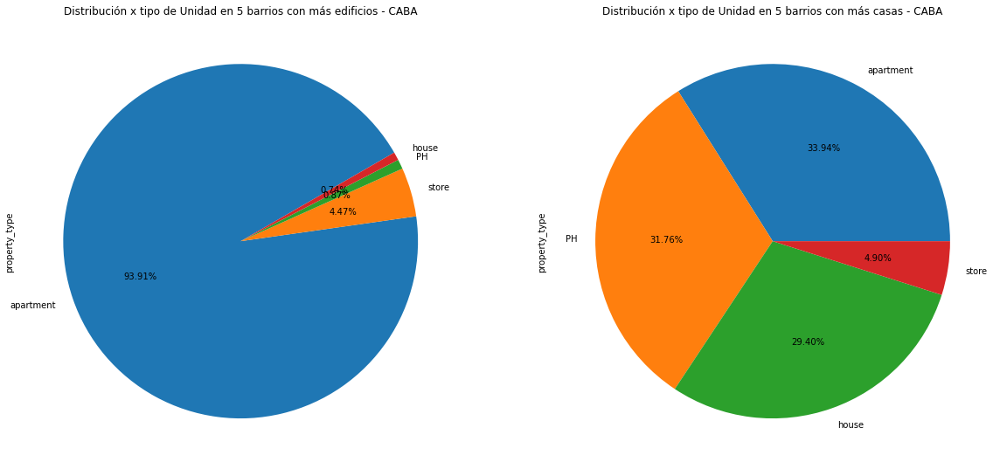

In [76]:
%matplotlib inline
barrios_casas = porcentaje_casas_ph.sort_values()[::-1][:5].index
barrios_edificios = porcentaje_edificios.sort_values()[::-1][:5].index
fig, axs = plt.subplots(1,2,figsize=(20,10))
data.loc[data.place_name.isin(barrios_edificios)].property_type.value_counts()\
.plot(x=None,y=None, kind='pie', startangle=30, ax=axs[0],autopct='%1.2f%%', 
      title='Distribución x tipo de Unidad en 5 barrios con más edificios - CABA')
data.loc[data.place_name.isin(barrios_casas)].property_type.value_counts()\
.plot(x=None,y=None, kind='pie', ax=axs[1],autopct='%1.2f%%',
     title='Distribución x tipo de Unidad en 5 barrios con más casas - CABA')

**DETECCION DE OUTLIERS**

<a id="section_outliers"></a> 
### 8. Detección de Outliers




En primer lugar se analizarán los valores extremos que puede haber en los precios y en las superficies. Esto será de utilidad para luego imputar usando medidas de tendencia central, ya que las mismas pueden ser sensibles a outliers.

Se inicia quitando outliers, ya que cuando se imputa se modifica la distribución de los datos, pudiendo modificar los resultados finales.

Una posible pregunta que surge es si conviene primero imputar faltantes y luego remover outliers, o lo contrario. Cuando se imputa se modifica la distribución de los datos. Por eso, las cotas que se utilicen para definir los outliers se verán afectadas por este cambio y modificarán los resultados finales. Entonces el primer paso será quitar outliers con la variables **price y price_usd_per_m2**. 

In [77]:
print(data.price.min())
print(data.price.max()) 
print(data.price.shape)

0.0
46545445.0
(115647,)


In [78]:
data_tmp_1 = data.loc[(data.price > data.price.quantile(0.03)) & (data.price< data.price.quantile(0.97))]
print(data_tmp_1.price.min())
print(data_tmp_1.price.max())
print(data_tmp_1.price.shape)

46661.61
917800.0
(92351,)


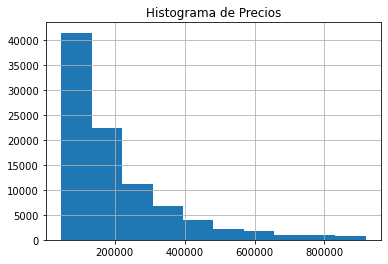

In [79]:
bin=10
plt.hist(data_tmp_1['price'])
plt.title('Histograma de Precios')
plt.grid(True)

<AxesSubplot:title={'center':'price'}, xlabel='property_type'>

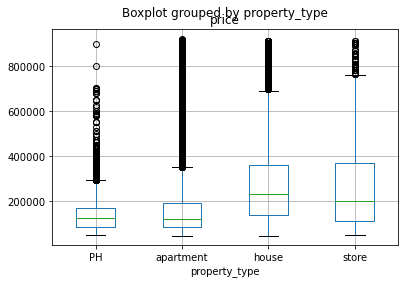

In [80]:
df_tmp_1_type = data_tmp_1.loc[:, ['price','property_type']]
df_tmp_1_type.boxplot(column='price', by='property_type')

Hacemos lo mismo para price_usd_per_m2_clean.

In [81]:
print(data_tmp_1.price_usd_per_m2_clean.min())
print(data_tmp_1.price_usd_per_m2_clean.max()) 
print(data_tmp_1.price_usd_per_m2_clean.shape)

0.058231779726195976
550000.0
(92351,)


<AxesSubplot:xlabel='price_usd_per_m2_clean', ylabel='Density'>

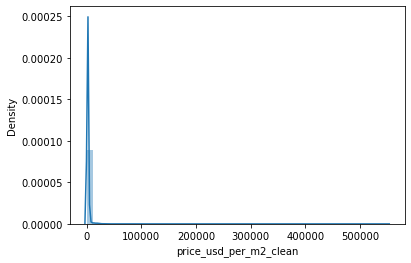

In [82]:
sns.distplot(data_tmp_1['price_usd_per_m2_clean'])

In [83]:
#q25 = data_tmp_1.price_usd_per_m2_clean.quantile(0.25)
#q75 = data_tmp_1.price_usd_per_m2_clean.quantile(0.75)
#iqr = q75 - q25
#upper_limit = q75 + 1.5 * iqr
#lower_limit = q25 - 0.98 * iqr

#data_tmp_2 = data_tmp_1.loc\
#[(data_tmp_1.price_usd_per_m2_clean >= lower_limit) & \
# (data_tmp_1.price_usd_per_m2_clean<= upper_limit)]

#print(data_tmp_2.price_usd_per_m2_clean.min())
#print(data_tmp_2.price_usd_per_m2_clean.max())
#print(data_tmp_2.price_usd_per_m2_clean.shape)

In [84]:
data_tmp_2 = data_tmp_1.loc\
[(data_tmp_1.price_usd_per_m2_clean > data_tmp_1.price_usd_per_m2_clean.quantile(0.03)) & \
 (data_tmp_1.price_usd_per_m2_clean< data_tmp_1.price_usd_per_m2_clean.quantile(0.97))]
print(data_tmp_2.price_usd_per_m2_clean.min())
print(data_tmp_2.price_usd_per_m2_clean.max())
print(data_tmp_2.price_usd_per_m2_clean.shape)

281.6758295964125
5814.871794871794
(81155,)


<AxesSubplot:title={'center':'price_usd_per_m2_clean'}, xlabel='property_type'>

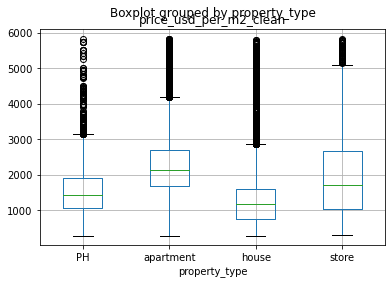

In [85]:
df_tmp_2_type = data_tmp_2.loc[:, ['price_usd_per_m2_clean','property_type']]
df_tmp_2_type.boxplot(column='price_usd_per_m2_clean', by='property_type')

<AxesSubplot:xlabel='price_usd_per_m2_clean', ylabel='Density'>

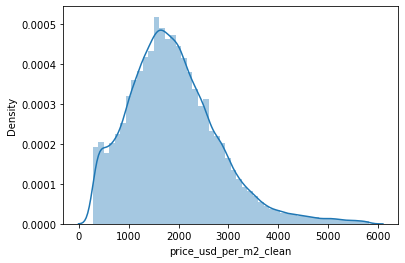

In [86]:
sns.distplot(data_tmp_2['price_usd_per_m2_clean'])

<AxesSubplot:xlabel='price_usd_per_m2_clean'>

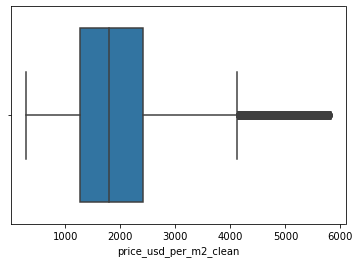

In [87]:
sns.boxplot(x = data_tmp_2['price_usd_per_m2_clean'])

In [88]:
print(data_tmp_2.total_surface_clean.min())
print(data_tmp_2.total_surface_clean.max()) 
print(data_tmp_2.total_surface_clean.shape)

9.0
49000.0
(81155,)


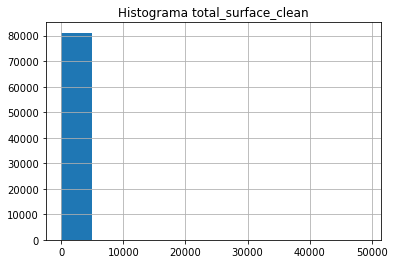

In [89]:
bin=50
plt.hist(data_tmp_2['total_surface_clean'])
plt.title('Histograma total_surface_clean')
plt.grid(True)

<AxesSubplot:xlabel='total_surface_clean', ylabel='Density'>

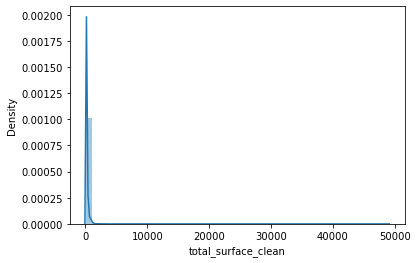

In [90]:
sns.distplot(data_tmp_2['total_surface_clean'])

In [91]:
data_tmp_3 = data_tmp_2.loc\
[(data_tmp_2.total_surface_clean > data_tmp_2.total_surface_clean.quantile(0.03)) & \
 (data_tmp_2.total_surface_clean < data_tmp_2.total_surface_clean.quantile(0.997))]
print(data_tmp_3.total_surface_clean.min())
print(data_tmp_3.total_surface_clean.max())
print(data_tmp_3.total_surface_clean.shape)

31.0
1199.0
(78195,)


<AxesSubplot:title={'center':'total_surface_clean'}, xlabel='property_type'>

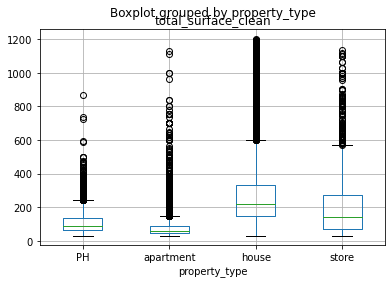

In [92]:
df_tmp_3_type = data_tmp_3.loc[:, ['total_surface_clean','property_type']]
df_tmp_3_type.boxplot(column='total_surface_clean', by='property_type')

In [93]:
obtener_info_data(data_tmp_3)

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
Unnamed: 0,0,78195,0.0,100.0,int64
operation,0,78195,0.0,100.0,object
property_type,0,78195,0.0,100.0,object
place_name,0,78195,0.0,100.0,object
place_with_parent_names,0,78195,0.0,100.0,object
country_name,0,78195,0.0,100.0,object
state_name,0,78195,0.0,100.0,object
geonames_id,10036,68159,12.8,87.2,float64
lat-lon,33008,45187,42.2,57.8,object
lat,4596,73599,5.9,94.1,float64


**CONCLUSIÓN:** Se observa que existen muchos outliers, o valores atípicos, los cuales pueden generar cierto ruido en nuestro análisis por lo que se procedió a la eliminación los mismos.

<a id="section_extras"></a> 
### 9. Extras


#### a) Revisar los Precios/M2 por Barrio en Capital

Haremos un ranking de los 10 barrios más caros de Capital Federal.

[Text(0.5, 1.0, 'Top 10 Barrios Más Caros CABA')]

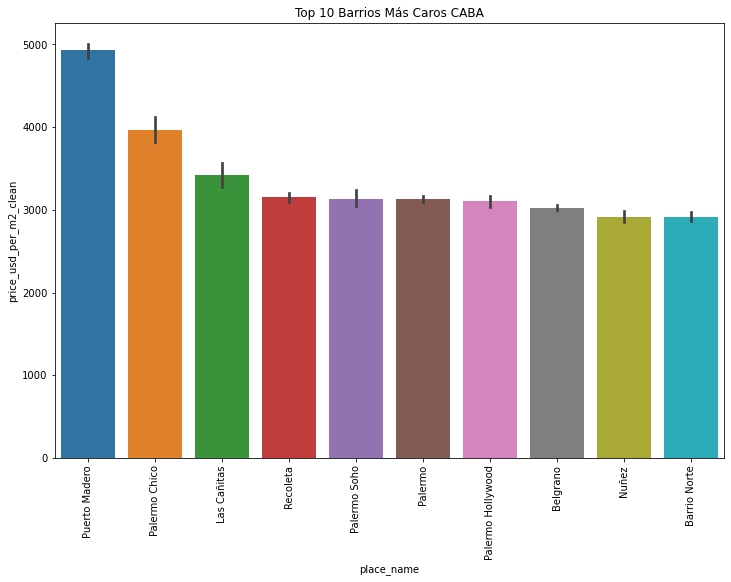

In [94]:
# Acá configuramos el tamaño de las figuras
capital_filt = data_tmp_3.loc[(data_tmp_3['state_name'] == 'Capital Federal')]
plt.rcParams['figure.figsize'] = (12,8)
# Seteamos opciones de pandas sobre las columnas y su ancho
plt.xticks(rotation = 90)
barrios_capital_filt = capital_filt.groupby('place_name')['price_usd_per_m2_clean']\
.mean().sort_values(ascending=False)[:10].index
sns.barplot(x="place_name", y="price_usd_per_m2_clean", order=barrios_capital_filt, data=data_tmp_3).\
set(title='Top 10 Barrios Más Caros CABA')

In [95]:
barrios_capital_filt

Index(['Puerto Madero', 'Palermo Chico', 'Las Cañitas', 'Recoleta',
       'Palermo Soho', 'Palermo', 'Palermo Hollywood', 'Belgrano', 'Nuñez',
       'Barrio Norte'],
      dtype='object', name='place_name')

[Text(0.5, 1.0, 'Top 10 Barrios Más Baratos CABA')]

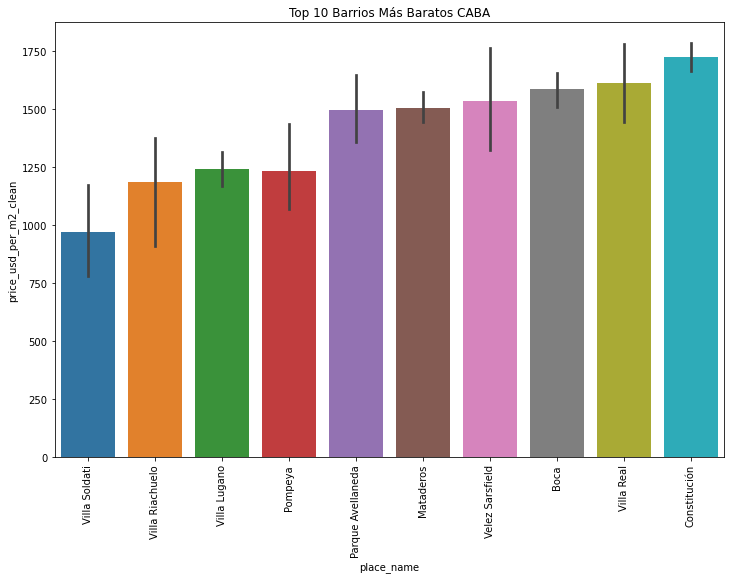

In [96]:
capital_filt = data_tmp_3.loc[(data_tmp_3['state_name'] == 'Capital Federal')]
plt.rcParams['figure.figsize'] = (12,8)
plt.xticks(rotation = 90)
barrios_capital_filt = capital_filt.groupby('place_name')['price_usd_per_m2_clean']\
.mean().sort_values(ascending=True)[:10].index
sns.barplot(x="place_name", y="price_usd_per_m2_clean", order=barrios_capital_filt, data=data_tmp_3).\
set(title='Top 10 Barrios Más Baratos CABA')

[Text(0.5, 1.0, 'Precios por m2 Barrios CABA')]

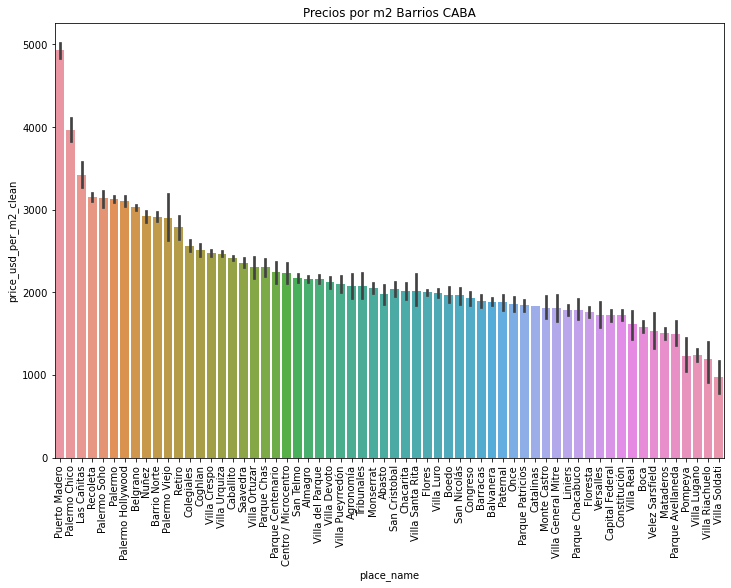

In [97]:
barrios_capital_filt = capital_filt.groupby('place_name')['price_usd_per_m2_clean']\
.mean().sort_values(ascending=False).index
plt.xticks(rotation = 90)
sns.barplot(x="place_name", y="price_usd_per_m2_clean", order=barrios_capital_filt, data=data_tmp_3).\
set(title='Precios por m2 Barrios CABA')

In [98]:
mas_caros = capital_filt.pivot_table(index='place_name', values='price_usd_per_m2_clean', aggfunc='mean').\
                                    sort_values(by='price_usd_per_m2_clean', ascending=False)[:10]
mas_caros


,price_usd_per_m2_clean
place_name,
Puerto Madero,4929.976662
Palermo Chico,3960.208415
Las Cañitas,3421.739423
Recoleta,3150.358875
Palermo Soho,3135.836371
Palermo,3131.757885
Palermo Hollywood,3102.922051
Belgrano,3027.151922
Nuñez,2917.900530


In [99]:
mas_baratos = capital_filt.pivot_table(index='place_name', values='price_usd_per_m2_clean', aggfunc='mean').\
                                    sort_values(by='price_usd_per_m2_clean', ascending=True)[:10]
mas_baratos

,price_usd_per_m2_clean
place_name,
Villa Soldati,970.498845
Villa Riachuelo,1187.184741
Villa Lugano,1239.134680
Pompeya,1272.887161
Parque Avellaneda,1495.776984
Mataderos,1504.472475
Velez Sarsfield,1535.489576
Boca,1585.252198
Villa Real,1611.739175


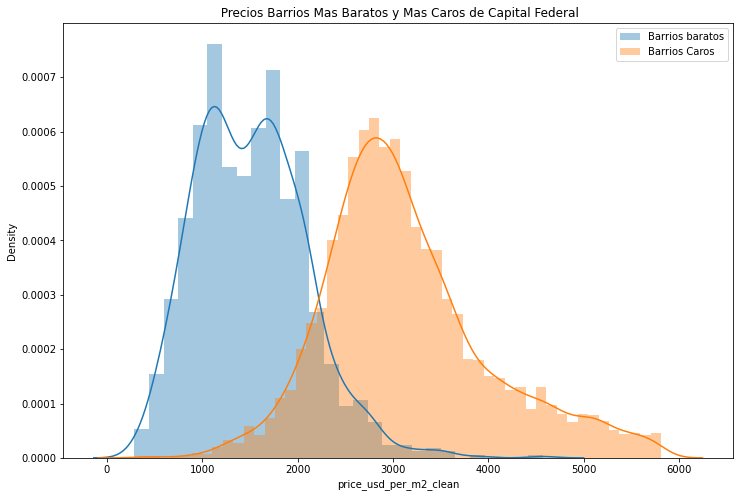

In [100]:
mas_caros_i = mas_caros.index
mas_baratos_i = mas_baratos.index
sns.distplot(data_tmp_3.loc[data_tmp_3.place_name.isin(mas_baratos_i)].price_usd_per_m2_clean, \
             label="Barrios baratos", kde=True)
sns.distplot(data_tmp_3.loc[data_tmp_3.place_name.isin(mas_caros_i)].price_usd_per_m2_clean, \
             label="Barrios Caros", kde=True)
plt.title(" Precios Barrios Mas Baratos y Mas Caros de Capital Federal")
plt.legend()


<AxesSubplot:xlabel='place_name', ylabel='price_usd_per_m2_clean'>

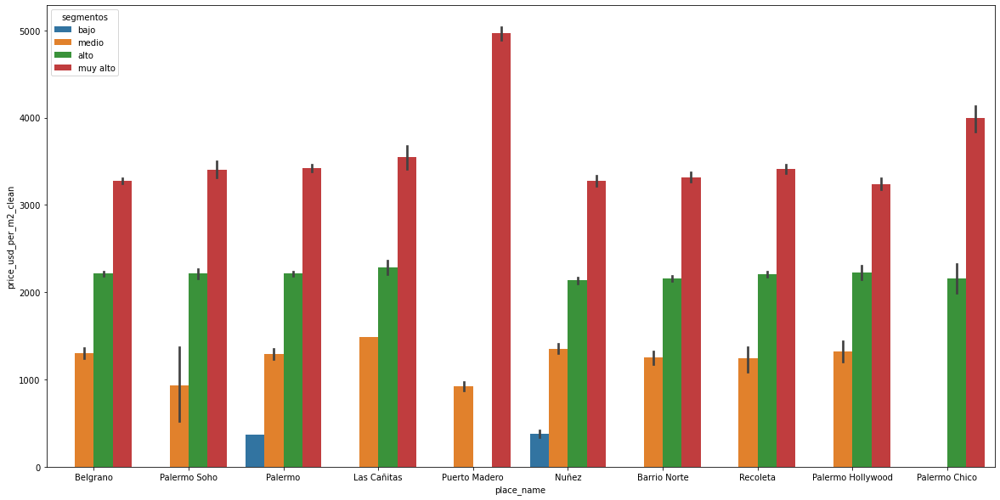

In [101]:
capital_filt["segmentos"]= pd.cut(capital_filt.price_usd_per_m2_clean,bins=[0,500,1500,2500,np.inf], labels=["bajo","medio","alto","muy alto"])

fig= plt.figure(figsize=(20,10))
ax = plt.axes

sns.barplot(data=capital_filt[capital_filt.place_name.isin(mas_caros_i)], x="place_name", y="price_usd_per_m2_clean", hue="segmentos")

<AxesSubplot:xlabel='place_name', ylabel='price_usd_per_m2_clean'>

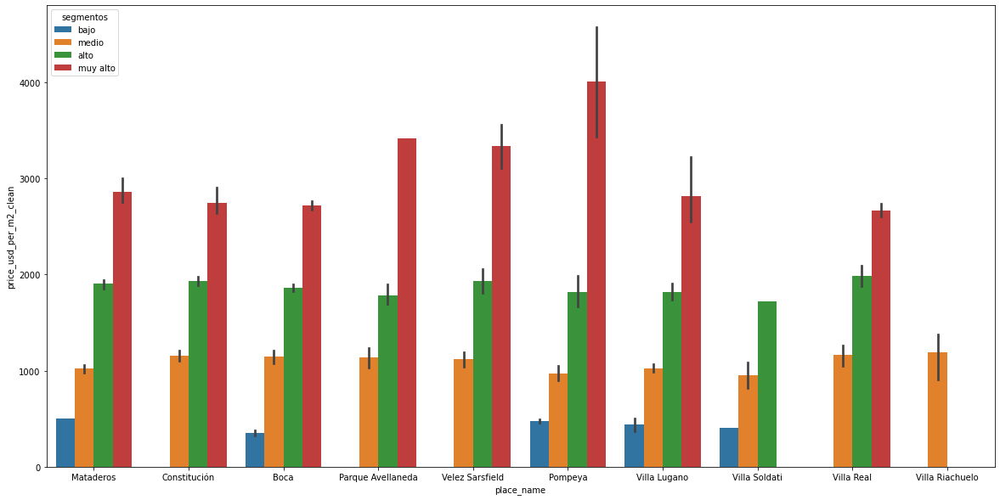

In [102]:
fig= plt.figure(figsize=(20,10))
ax = plt.axes

sns.barplot(data=capital_filt[capital_filt.place_name.isin(mas_baratos_i)], x="place_name", y="price_usd_per_m2_clean", hue="segmentos")

-----------------------------------------
#### b) Graficar Mapas

,WKT,BARRIO,COMUNA,PERIMETRO,AREA
0,"POLYGON ((-58.4528200492791 -34.5959886570639,...",CHACARITA,15.0,7725.695228,3.118101e+06
1,"POLYGON ((-58.4655768128541 -34.5965577078058,...",PATERNAL,15.0,7087.513295,2.229829e+06
2,"POLYGON ((-58.4237529813037 -34.5978273383243,...",VILLA CRESPO,15.0,8132.699348,3.613584e+06
3,"POLYGON ((-58.4946097568899 -34.6148652395239,...",VILLA DEL PARQUE,11.0,7705.389797,3.399596e+06
4,"POLYGON ((-58.4128700313089 -34.6141162515854,...",ALMAGRO,5.0,8537.901368,4.050752e+06
5,"POLYGON ((-58.4306058283309 -34.6070470885963,...",CABALLITO,6.0,10990.964471,6.851029e+06
6,"POLYGON ((-58.4819203599833 -34.6242871724757,...",VILLA SANTA RITA,11.0,5757.752335,2.153691e+06
7,"POLYGON ((-58.5034920611534 -34.6240324216321,...",MONTE CASTRO,10.0,7361.036418,2.627481e+06
8,"POLYGON ((-58.525116079791 -34.613999981063,-5...",VILLA REAL,10.0,5070.965652,1.334146e+06
9,"POLYGON ((-58.4452515823782 -34.6420397134706,...",FLORES,7.0,15772.425185,8.590784e+06


,BARRIO,COMUNA,PERIMETRO,AREA
0,CHACARITA,15.0,7725.695228,3.118101e+06
1,PATERNAL,15.0,7087.513295,2.229829e+06
2,VILLA CRESPO,15.0,8132.699348,3.613584e+06
3,VILLA DEL PARQUE,11.0,7705.389797,3.399596e+06
4,ALMAGRO,5.0,8537.901368,4.050752e+06
5,CABALLITO,6.0,10990.964471,6.851029e+06
6,VILLA SANTA RITA,11.0,5757.752335,2.153691e+06
7,MONTE CASTRO,10.0,7361.036418,2.627481e+06
8,VILLA REAL,10.0,5070.965652,1.334146e+06
9,FLORES,7.0,15772.425185,8.590784e+06


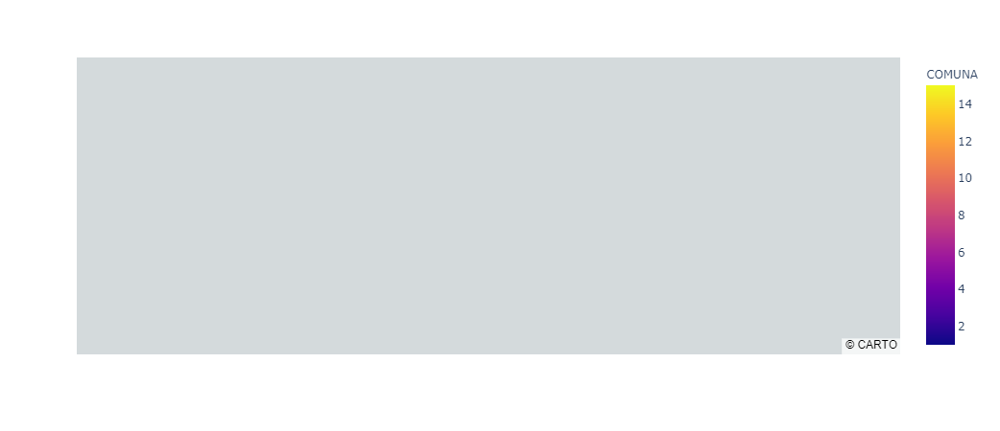

In [103]:
# Importamos archivo con los barrios (Polígonos en formato WKT)
polys=pd.read_csv('https://raw.githubusercontent.com/francodegio/DigitalHouse/master/barrios.csv',encoding='latin1')

display(polys.head(10))


# probemos con el decimo, miremos el poligono de FLORES
poly=polys.iloc[9].WKT
poly

# para que plotly grafique poligonos, se lo tenemos que pasar en el formato GEOjson
# esta libreria convierte strings wkt en GEOJSON
# poligono de FLORES en formato json
gjson=wkt.loads(poly)

# necesitamos pasar las geometrias en este formato
# geojson (GeoJSON-formatted dict) – Must contain a Polygon feature collection, with IDs, which are references from locations.
# el input es un GEOJSON, un diccionario del tipo feature collection, las features es la lista de las shapes, 
#con su geometria y su id.
#un dict con esta llave general y una lista de 'features' que son los gjson que tira el geomet del poligono FLORES

gd=dict({'type': 'FeatureCollection' ,'features' : [dict({'geometry': gjson , 'id' : 'FLORES' })]})
gd

df_1 = polys.drop('WKT', axis=1)
display(df_1.head(10)) 


fig = px.choropleth_mapbox(df_1,geojson=gd, locations='BARRIO', mapbox_style="carto-positron", color = 'COMUNA')
fig.show()
# Aqui debemos sacar zoom porque se inicializa la imagen en punto cero de coordenadas y luego buscar CABA.

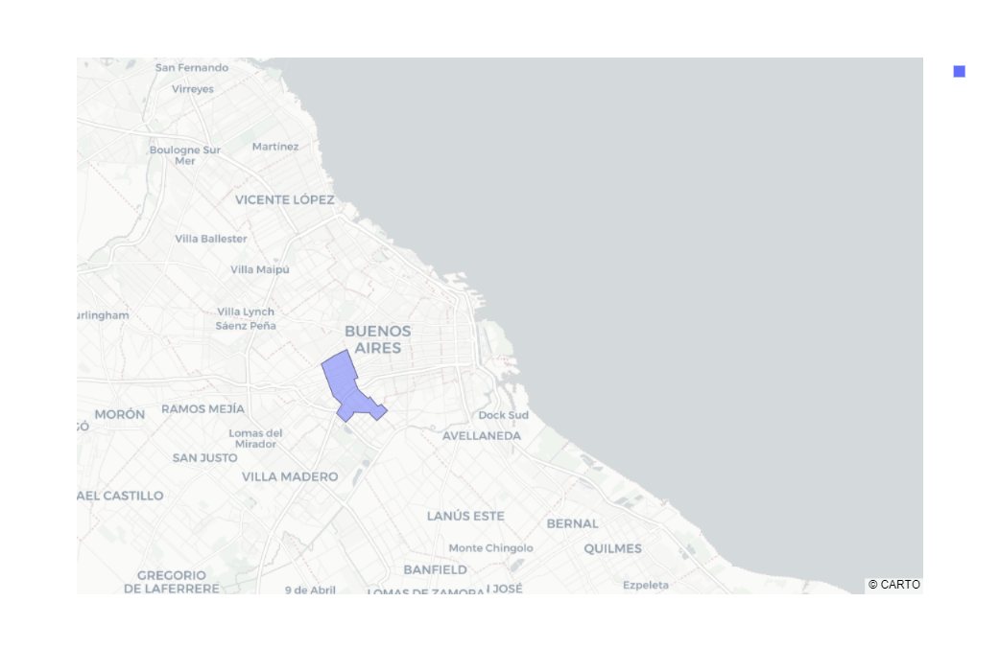

In [104]:
# polys es el df comun y corriente de pandas
# gd es un diccionario con las geometrias en geojson
# con el parametro 'locations' le digo en que columna del df normal esta las ID 
# del poligono del diccionario GEOJSEON llamado 'gd'
# Pongo coordenadas de Lat-Lon para que inicie en BsAs

fig = px.choropleth_mapbox(df_1,geojson=gd, locations='BARRIO', mapbox_style="carto-positron",
                           center = {"lat": -34.6, "lon": -58.35}, 
                           opacity=0.5, zoom= 10, height=700)
fig.show()

-----------------------------------------
#### c) Graficar todos los Barrios

'SAN CRISTOBAL'

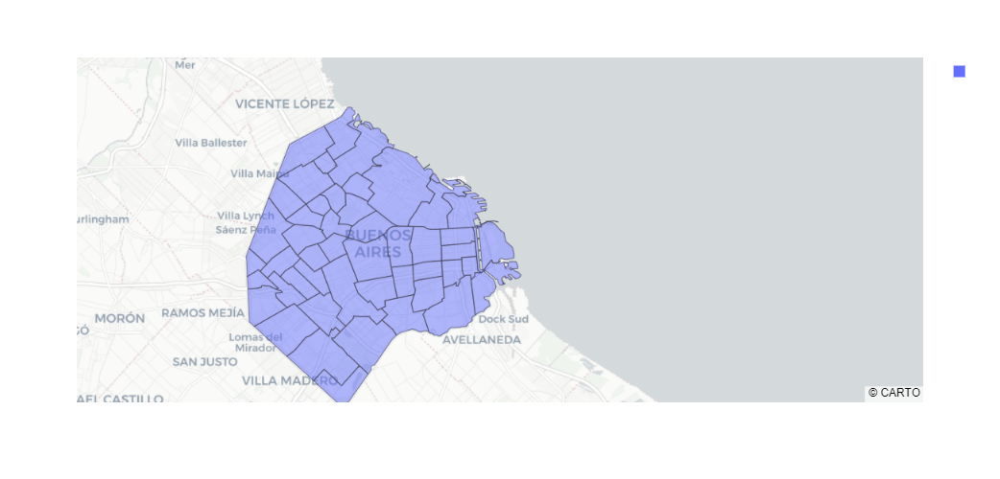

In [105]:
# Nesecito la lista de diccionarios con la geo y el id de las shapes, 
# uso el mismo del dataframe para generar esta lista, itero por fila convierto el WKT y saco el ID
# el iterrows tira indice y la serie fila, por eso el for i,x, pero solo uso el x

shapes=[ dict({'geometry': wkt.loads(x.WKT) , 'id' : x.BARRIO }) for i,x in polys.iterrows()] 

# ahora armo el diccionario GeoJSON con esta lista:

gd2=dict({'type': 'FeatureCollection' ,'features' : shapes })

display(gd2['features'][12]['id'])

fig = px.choropleth_mapbox(df_1,geojson=gd2, locations='BARRIO', mapbox_style="carto-positron",center = {"lat": -34.6, "lon": -58.35},   opacity=0.5, zoom= 10, height=500)
fig.show()

-----------------------------------------
#### c) Graficar precio/M2 por cada Barrio

,WKT,barrio,COMUNA,PERIMETRO,AREA
0,"POLYGON ((-58.4528200492791 -34.5959886570639,...",chacarita,15.0,7725.695228,3.118101e+06
1,"POLYGON ((-58.4655768128541 -34.5965577078058,...",paternal,15.0,7087.513295,2.229829e+06
2,"POLYGON ((-58.4237529813037 -34.5978273383243,...",villa crespo,15.0,8132.699348,3.613584e+06
3,"POLYGON ((-58.4946097568899 -34.6148652395239,...",villa del parque,11.0,7705.389797,3.399596e+06
4,"POLYGON ((-58.4128700313089 -34.6141162515854,...",almagro,5.0,8537.901368,4.050752e+06


constitucion
villa gral. mitre
agronomia
nueva pompeya
villa pueyrredon
san nicolas


,WKT,barrio,COMUNA,PERIMETRO,AREA,price_x_m2
0,"POLYGON ((-58.4528200492791 -34.5959886570639,...",chacarita,15.0,7725.695228,3.118101e+06,2020.507687
1,"POLYGON ((-58.4655768128541 -34.5965577078058,...",paternal,15.0,7087.513295,2.229829e+06,1878.564395
2,"POLYGON ((-58.4237529813037 -34.5978273383243,...",villa crespo,15.0,8132.699348,3.613584e+06,2472.637161
3,"POLYGON ((-58.4946097568899 -34.6148652395239,...",villa del parque,11.0,7705.389797,3.399596e+06,2160.034747
4,"POLYGON ((-58.4128700313089 -34.6141162515854,...",almagro,5.0,8537.901368,4.050752e+06,2160.300540


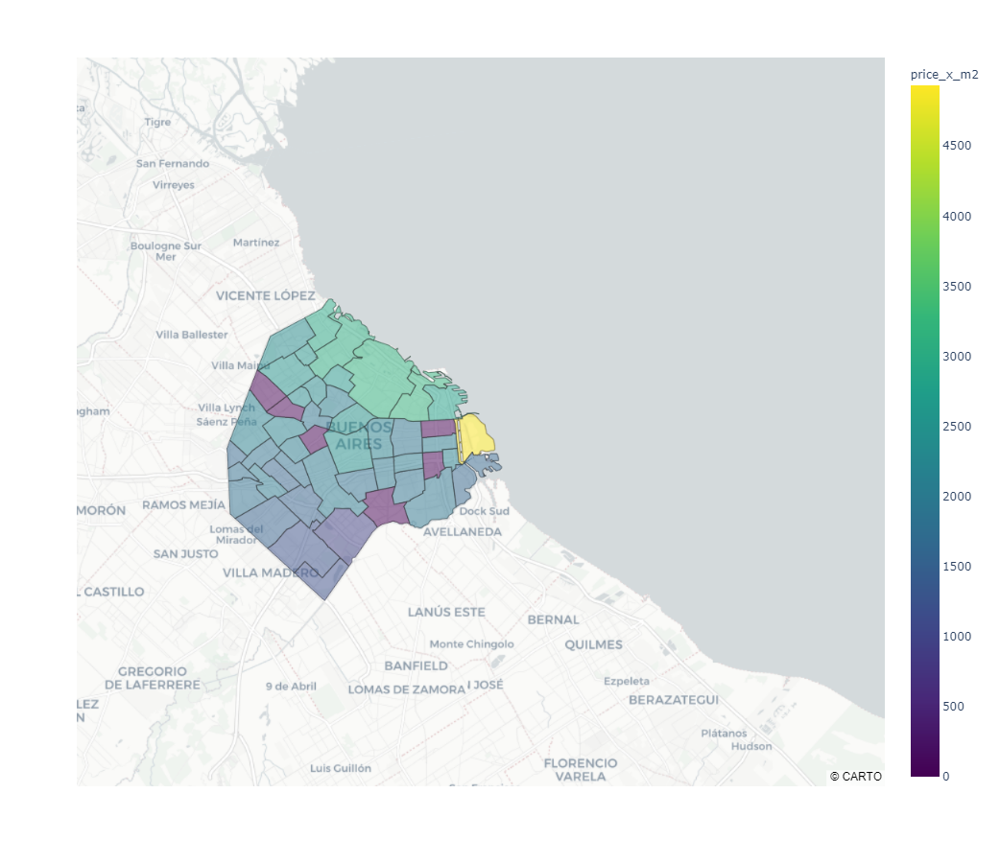

In [106]:
df2=data_tmp_3[data_tmp_3['state_name'] == 'Capital Federal']
df_2

df3=df2.groupby('place_name').mean()
df3

# como voy a comparar con el df de las shapes, paso a minusculas

df3.index = df3.index.map(str.lower)
df3

# paso a minusculas
polys.BARRIO=polys.BARRIO.apply(str.lower)
# le cambio el nombre a las columnas
polys=polys.rename(columns={"BARRIO": "barrio"})
display(polys.head())


# este metodo me devuelve el iloc de una string en la lista de indices, si es que existe
df3.index.get_loc('chacarita')

df3.iloc[13].price_usd_per_m2_clean

# armo un for para capturar los valores
px_x_m2=[]
for i,x in polys.iterrows():
    try:
        j=df3.index.get_loc(x.barrio)
        px_x_m2.append(df3.iloc[j].price_usd_per_m2_clean)
    except:
        # printeo los que no encuentra
        print(x.barrio)       
        px_x_m2.append(0.0)

# Agrego esta columna en polys
polys['price_x_m2']=px_x_m2
display(polys.head())

# lo armo de nuevo al geojson por que pase a minusculas los barrios y por lo tanto las id de las shapes

shapes=[ dict({'geometry': wkt.loads(x.WKT) , 'id' : x.barrio }) for i,x in polys.iterrows()] 
# ahora armo el diccionario GeoJSON con esta lista:

gd2=dict({'type': 'FeatureCollection' ,'features' : shapes })

fig = px.choropleth_mapbox(polys,geojson=gd2, locations='barrio', color='price_x_m2' ,mapbox_style="carto-positron",center = {"lat": -34.6, "lon": -58.35},   
                           opacity=0.5, zoom= 10, height=900 ,  color_continuous_scale="Viridis" )
fig.show()

In [107]:
data_tmp_3.columns

Index(['Unnamed: 0', 'operation', 'property_type', 'place_name',
       'place_with_parent_names', 'country_name', 'state_name', 'geonames_id',
       'lat-lon', 'lat', 'lon', 'price', 'currency',
       'price_aprox_local_currency', 'price_aprox_usd', 'surface_total_in_m2',
       'surface_covered_in_m2', 'price_usd_per_m2', 'price_per_m2', 'floor',
       'rooms', 'expenses', 'properati_url', 'description', 'title',
       'image_thumbnail', 'amb_title', 'amb_description', 'dorm_title',
       'dorm_description', 'place_state_name', 'cochera', 'seguridad',
       'parrilla', 'pileta', 'terraza', 'lavadero', 'quincho', 'balcon',
       'estrenar', 'sum', 'vista', 'vestidor', 'patio', 'rooms_clean',
       'm2_title', 'm2_description', 'total_surface_clean',
       'surface_covered_clean', 'bath_title', 'bath_description',
       'price_usd_per_m2_clean'],
      dtype='object')

In [108]:
cols_a_dropear = ['amb_description', 'dorm_description', 'bath_description', 'bath_title', 'operation', 
                  'place_with_parent_names', 'country_name', 'lat-lon', 'currency', 
                    'surface_total_in_m2', 'surface_covered_in_m2', 
                  'floor', 'rooms', 'expenses', 'dorm_title', 'm2_title', 'm2_description', 'Unnamed: 0']
for col in cols_a_dropear:
    borrar_columna(data_tmp_3, col)
    

Eliminando columna: amb_description
Lista de columnas eliminadas: ['state_name1', 'jardin', 'subte', 'gimnasio', 'nuevo', 'nueva', 'estacionamiento', 'parking', 'gym', 'moderno', 'solarium', 'lat_geo', 'lon_geo', 'amb_description']
----------------------------------------------------------------------------------------------------
Eliminando columna: dorm_description
Lista de columnas eliminadas: ['state_name1', 'jardin', 'subte', 'gimnasio', 'nuevo', 'nueva', 'estacionamiento', 'parking', 'gym', 'moderno', 'solarium', 'lat_geo', 'lon_geo', 'amb_description', 'dorm_description']
----------------------------------------------------------------------------------------------------
Eliminando columna: bath_description
Lista de columnas eliminadas: ['state_name1', 'jardin', 'subte', 'gimnasio', 'nuevo', 'nueva', 'estacionamiento', 'parking', 'gym', 'moderno', 'solarium', 'lat_geo', 'lon_geo', 'amb_description', 'dorm_description', 'bath_description']
----------------------------------------

In [109]:
data_tmp_3.columns

Index(['property_type', 'place_name', 'state_name', 'geonames_id', 'lat',
       'lon', 'price', 'price_aprox_local_currency', 'price_aprox_usd',
       'price_usd_per_m2', 'price_per_m2', 'properati_url', 'description',
       'title', 'image_thumbnail', 'amb_title', 'place_state_name', 'cochera',
       'seguridad', 'parrilla', 'pileta', 'terraza', 'lavadero', 'quincho',
       'balcon', 'estrenar', 'sum', 'vista', 'vestidor', 'patio',
       'rooms_clean', 'total_surface_clean', 'surface_covered_clean',
       'price_usd_per_m2_clean'],
      dtype='object')

In [110]:
data_final = data_tmp_3.copy()
data_final.head()

,property_type,place_name,state_name,geonames_id,lat,lon,price,price_aprox_local_currency,price_aprox_usd,price_usd_per_m2,price_per_m2,properati_url,description,title,image_thumbnail,...,parrilla,pileta,terraza,lavadero,quincho,balcon,estrenar,sum,vista,vestidor,patio,rooms_clean,total_surface_clean,surface_covered_clean,price_usd_per_m2_clean
0,PH,Mataderos,Capital Federal,3430787.0,-34.661824,-58.508839,62000.0,1093959.0,62000.0,1127.272727,1550.000000,http://www.properati.com.ar/15bo8_venta_ph_mat...,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB,https://thumbs4.properati.com/8/BluUYiHJLhgIIK...,...,0,0,0,1,0,0,0,0,0,0,1,2.0,55.0,40.0,1127.272727
2,apartment,Mataderos,Capital Federal,3430787.0,-34.652262,-58.522982,72000.0,1270404.0,72000.0,1309.090909,1309.090909,http://www.properati.com.ar/15bod_venta_depart...,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO,https://thumbs4.properati.com/5/SXKr34F_IwG3W_...,...,0,0,0,1,0,0,0,0,0,0,0,2.0,55.0,55.0,1309.090909
4,apartment,Centro,Buenos Aires Costa Atlántica,3435548.0,-38.002626,-57.549447,64000.0,1129248.0,64000.0,1828.571429,1828.571429,http://www.properati.com.ar/15bok_venta_depart...,DEPARTAMENTO CON FANTÁSTICA ILUMINACIÓN NATURA...,DEPTO 2 AMB AL CONTRAFRENTE ZONA CENTRO/PLAZA ...,https://thumbs4.properati.com/5/xrRqlNcSI_vs-f...,...,0,0,0,0,0,0,0,0,0,0,0,2.0,35.0,35.0,1828.571429
6,PH,Munro,Bs.As. G.B.A. Zona Norte,3430511.0,-34.532957,-58.521782,130000.0,2293785.0,130000.0,1226.415094,1666.666667,http://www.properati.com.ar/15bor_venta_ph_mun...,MUY BUEN PH AL FRENTE CON ENTRADA INDEPENDIENT...,"MUY BUEN PH AL FRENTE DOS DORMITORIOS , PATIO,...",https://thumbs4.properati.com/5/6GOXsHCyDu1aGx...,...,0,0,0,1,0,0,0,0,0,0,1,3.0,106.0,78.0,1226.415094
7,apartment,Belgrano,Capital Federal,3436077.0,-34.559873,-58.443362,138000.0,2434941.0,138000.0,3066.666667,3450.000000,http://www.properati.com.ar/15bot_venta_depart...,EXCELENTE MONOAMBIENTE A ESTRENAR AMPLIO SUPER...,JOSE HERNANDEZ 1400 MONOAMBIENTE ESTRENAR CAT...,https://thumbs4.properati.com/1/IHxARynlr8sPEW...,...,0,1,0,0,0,0,1,0,0,0,0,2.0,45.0,40.0,3066.666667


In [111]:
data_final.columns

Index(['property_type', 'place_name', 'state_name', 'geonames_id', 'lat',
       'lon', 'price', 'price_aprox_local_currency', 'price_aprox_usd',
       'price_usd_per_m2', 'price_per_m2', 'properati_url', 'description',
       'title', 'image_thumbnail', 'amb_title', 'place_state_name', 'cochera',
       'seguridad', 'parrilla', 'pileta', 'terraza', 'lavadero', 'quincho',
       'balcon', 'estrenar', 'sum', 'vista', 'vestidor', 'patio',
       'rooms_clean', 'total_surface_clean', 'surface_covered_clean',
       'price_usd_per_m2_clean'],
      dtype='object')

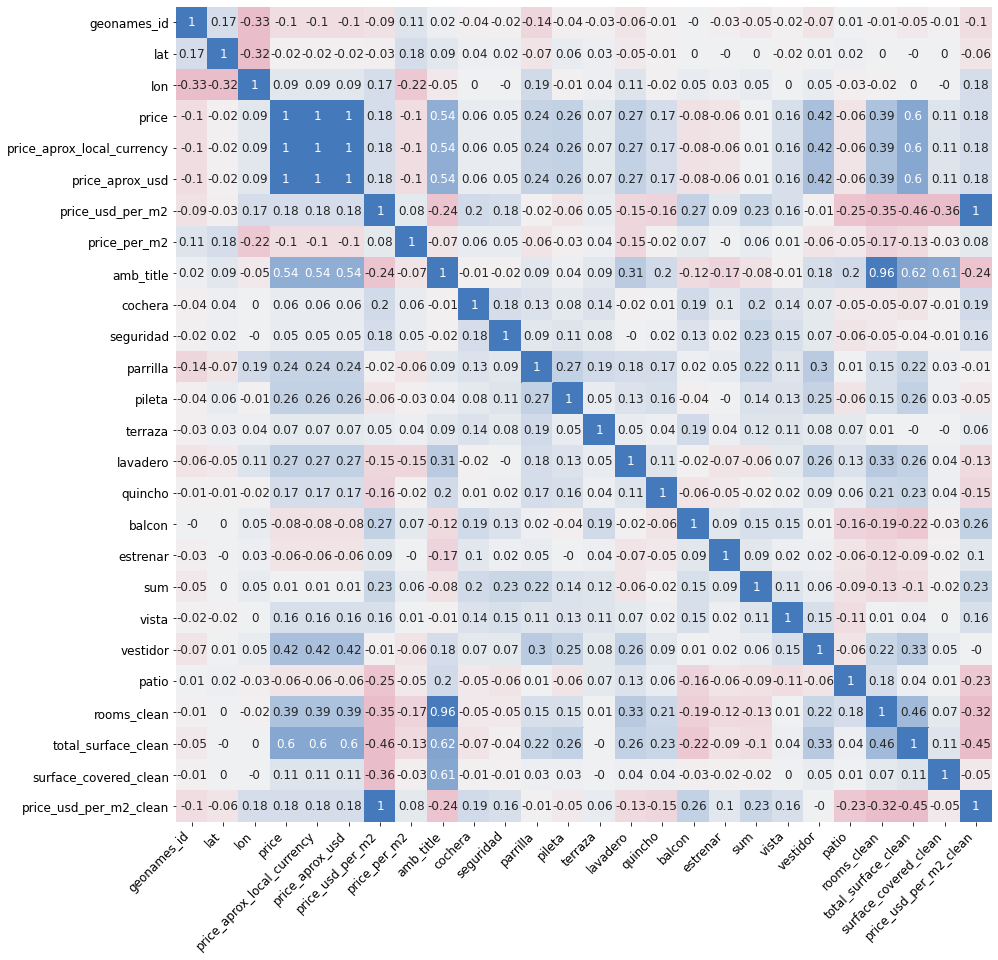

In [112]:
# Heatmap matriz de correlaciones
# ==============================================================================
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))

sns.heatmap(
    data_final.corr().round(2),
    annot     = True,
    cbar      = False,
    annot_kws = {"size": 12},
    vmin      = -0.3,
    vmax      = 1,
    center    = 0,
    cmap      = sns.diverging_palette(0, 250, n=100),
    #cmap      = sns.color_palette("vlag", as_cmap=False),
    square    = True,
    ax        = ax
)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation = 45,
    horizontalalignment = 'right',
)

ax.tick_params(labelsize = 12)

<AxesSubplot:xlabel='price_usd_per_m2_clean', ylabel='property_type'>

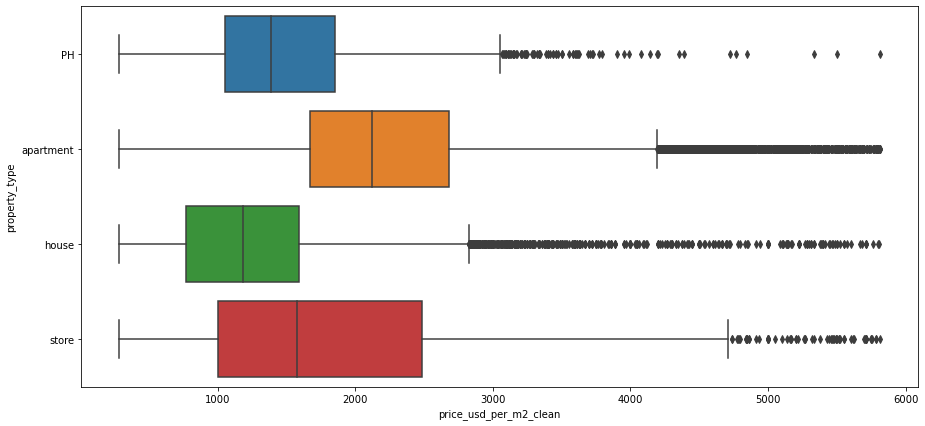

In [113]:
fig= plt.figure(figsize=(15,7))
sns.boxplot(x=data_final.price_usd_per_m2_clean, y=data_final.property_type)

In [114]:
obtener_info_data(data_final)

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
property_type,0,78195,0.0,100.0,object
place_name,0,78195,0.0,100.0,object
state_name,0,78195,0.0,100.0,object
geonames_id,10036,68159,12.8,87.2,float64
lat,4596,73599,5.9,94.1,float64
lon,4596,73599,5.9,94.1,float64
price,0,78195,0.0,100.0,float64
price_aprox_local_currency,0,78195,0.0,100.0,float64
price_aprox_usd,0,78195,0.0,100.0,float64
price_usd_per_m2,19936,58259,25.5,74.5,float64


In [115]:
data_final.columns

Index(['property_type', 'place_name', 'state_name', 'geonames_id', 'lat',
       'lon', 'price', 'price_aprox_local_currency', 'price_aprox_usd',
       'price_usd_per_m2', 'price_per_m2', 'properati_url', 'description',
       'title', 'image_thumbnail', 'amb_title', 'place_state_name', 'cochera',
       'seguridad', 'parrilla', 'pileta', 'terraza', 'lavadero', 'quincho',
       'balcon', 'estrenar', 'sum', 'vista', 'vestidor', 'patio',
       'rooms_clean', 'total_surface_clean', 'surface_covered_clean',
       'price_usd_per_m2_clean'],
      dtype='object')

In [116]:
data_final = data_final.rename(columns={'property_type': 'Tipo_Prop',
                          'place_name': 'Localidad',
                          'state_name': 'Provincia',
                          'geonames_id': 'Id_Localidad',
                          'price': 'Precio',
                           'rooms_clean': 'Habitaciones',
                           'total_surface_clean': 'Sup_Total',
                           'surface_covered_clean': 'Sup_Cubierta',
                           'price_usd_per_m2_clean': 'Precio_por_m2'
                          })

In [117]:
data_final.columns

Index(['Tipo_Prop', 'Localidad', 'Provincia', 'Id_Localidad', 'lat', 'lon',
       'Precio', 'price_aprox_local_currency', 'price_aprox_usd',
       'price_usd_per_m2', 'price_per_m2', 'properati_url', 'description',
       'title', 'image_thumbnail', 'amb_title', 'place_state_name', 'cochera',
       'seguridad', 'parrilla', 'pileta', 'terraza', 'lavadero', 'quincho',
       'balcon', 'estrenar', 'sum', 'vista', 'vestidor', 'patio',
       'Habitaciones', 'Sup_Total', 'Sup_Cubierta', 'Precio_por_m2'],
      dtype='object')

In [118]:
cols_a_dropear = ['price_aprox_local_currency', 'price_aprox_usd', 'price_usd_per_m2',
       'price_per_m2', 'properati_url', 'description', 'title','image_thumbnail', 
        'amb_title', 'place_state_name',]
for col in cols_a_dropear:
    borrar_columna(data_final, col)
print(data_final.columns)

Eliminando columna: price_aprox_local_currency
Lista de columnas eliminadas: ['state_name1', 'jardin', 'subte', 'gimnasio', 'nuevo', 'nueva', 'estacionamiento', 'parking', 'gym', 'moderno', 'solarium', 'lat_geo', 'lon_geo', 'amb_description', 'dorm_description', 'bath_description', 'bath_title', 'operation', 'place_with_parent_names', 'country_name', 'lat-lon', 'currency', 'surface_total_in_m2', 'surface_covered_in_m2', 'floor', 'rooms', 'expenses', 'dorm_title', 'm2_title', 'm2_description', 'Unnamed: 0', 'price_aprox_local_currency']
----------------------------------------------------------------------------------------------------
Eliminando columna: price_aprox_usd
Lista de columnas eliminadas: ['state_name1', 'jardin', 'subte', 'gimnasio', 'nuevo', 'nueva', 'estacionamiento', 'parking', 'gym', 'moderno', 'solarium', 'lat_geo', 'lon_geo', 'amb_description', 'dorm_description', 'bath_description', 'bath_title', 'operation', 'place_with_parent_names', 'country_name', 'lat-lon', 'cur

In [119]:
data_final = data_final.reset_index(drop=True)
data_final.head(3)

,Tipo_Prop,Localidad,Provincia,Id_Localidad,lat,lon,Precio,cochera,seguridad,parrilla,pileta,terraza,lavadero,quincho,balcon,estrenar,sum,vista,vestidor,patio,Habitaciones,Sup_Total,Sup_Cubierta,Precio_por_m2
0,PH,Mataderos,Capital Federal,3430787.0,-34.661824,-58.508839,62000.0,0,0,0,0,0,1,0,0,0,0,0,0,1,2.0,55.0,40.0,1127.272727
1,apartment,Mataderos,Capital Federal,3430787.0,-34.652262,-58.522982,72000.0,0,0,0,0,0,1,0,0,0,0,0,0,0,2.0,55.0,55.0,1309.090909
2,apartment,Centro,Buenos Aires Costa Atlántica,3435548.0,-38.002626,-57.549447,64000.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0,35.0,35.0,1828.571429


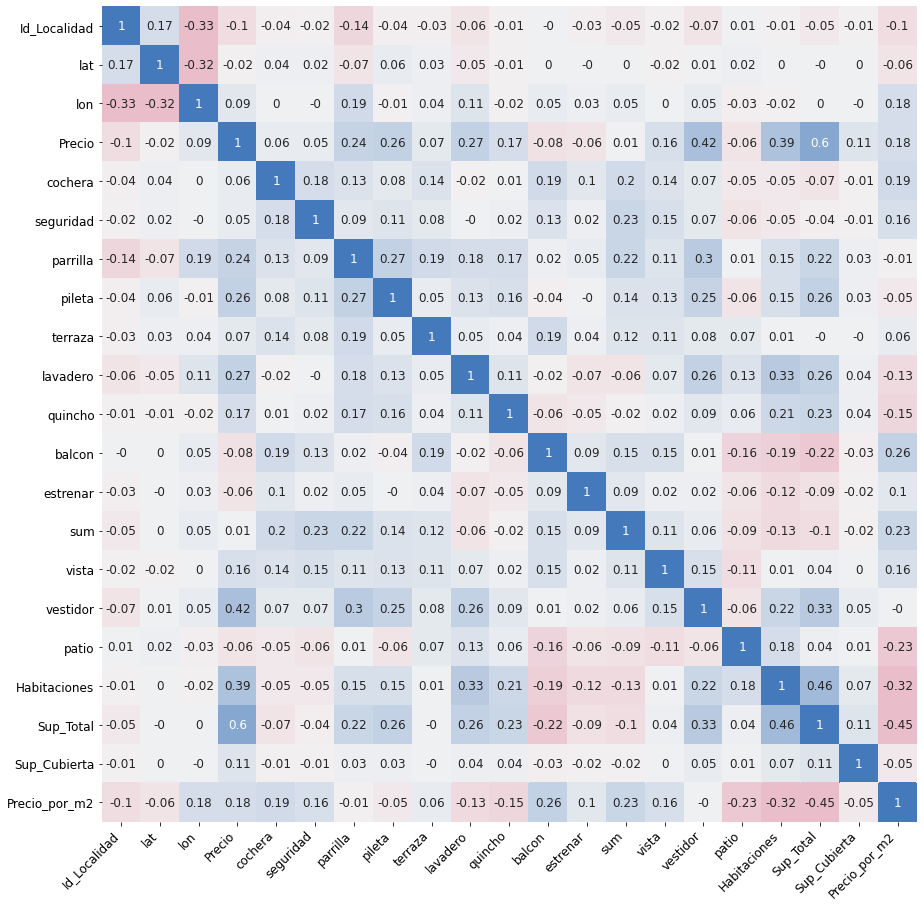

In [120]:
# Heatmap matriz de correlaciones
# ==============================================================================
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))

sns.heatmap(
    data_final.corr().round(2),
    annot     = True,
    cbar      = False,
    annot_kws = {"size": 12},
    vmin      = -0.3,
    vmax      = 1,
    center    = 0,
    cmap      = sns.diverging_palette(0, 250, n=100),
    #cmap      = sns.color_palette("vlag", as_cmap=False),
    square    = True,
    ax        = ax
)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation = 45,
    horizontalalignment = 'right',
)

ax.tick_params(labelsize = 12)

In [121]:
obtener_info_data(data_final)

,Nulos,NoNulos,NulosPorc,NoNulosPorc,TypeData
Tipo_Prop,0,78195,0.0,100.0,object
Localidad,0,78195,0.0,100.0,object
Provincia,0,78195,0.0,100.0,object
Id_Localidad,10036,68159,12.8,87.2,float64
lat,4596,73599,5.9,94.1,float64
lon,4596,73599,5.9,94.1,float64
Precio,0,78195,0.0,100.0,float64
cochera,0,78195,0.0,100.0,int32
seguridad,0,78195,0.0,100.0,int32
parrilla,0,78195,0.0,100.0,int32


<Figure size 1080x432 with 0 Axes>

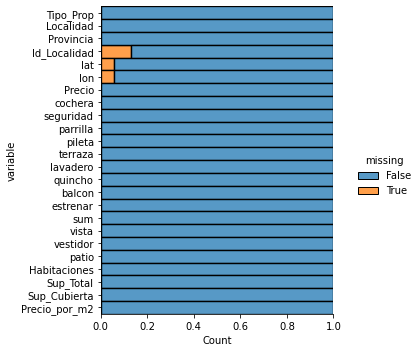

In [122]:
#Volvemos ejecutar el mismo grafico sobre el dataset modificado
#Se representa con un grafico los valores faltantes como "missing"
plt.figure(figsize=(15,6))
sns.displot(data=data_final.isna().melt(value_name="missing"), y="variable", hue="missing", multiple="fill", aspect=1)

<a id="section_exportacion"></a> 
### 10. Exportación de Dataframe Limpio


Ya realizando la limpieza del dataframe utilizando diferentes técnicas aprendidas en lo corrido del curso, se genera entonces la exportación de los datos finales en formato csv. los cuales posteriormente serán utlizados para la propuesta que se realizará a la empresa Properati.

In [123]:
data_final.to_csv('df_Properatti_limpio.csv')